In [ ]:
# Importing the required libraries

!pip install matplotlib-venn
!apt-get -qq install -y libfluidsynth1
# https://pypi.python.org/pypi/libarchive
!apt-get -qq install -y libarchive-dev && pip install -U libarchive
import libarchive
# https://pypi.python.org/pypi/pydot
!apt-get -qq install -y graphviz && pip install pydot
import pydot
!pip install cartopy
import cartopy

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os
import itertools

from glob import glob
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
# Importing ConfusionMatrixDisplay instead of plot_confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.utils import plot_model


E: Package 'libfluidsynth1' has no installation candidate


In [ ]:
# importing from google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Reading the CSV file
import os
import pandas as pd

folder_path = '/content/drive/My Drive/projectsreq'
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv') and os.path.isfile(os.path.join(folder_path, f))] # Filter out directories

dataframes = {}
for csv_file in csv_files:
    file_path = os.path.join(folder_path, csv_file)
    df = pd.read_csv(file_path)
    dataframes[csv_file] = df  # Store each DataFrame in a dictionary
    print(f"Loaded {csv_file} with shape {df.shape}")

Loaded skin-cancer-mnist-ham10000.csv.csv with shape (10015, 7)
Loaded HAM10000_metadata.csv with shape (10015, 7)


In [ ]:
# Reading the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   lesion_id      10015 non-null  object 
 1   image_id       10015 non-null  object 
 2   dx             10015 non-null  object 
 3   dx_type        10015 non-null  object 
 4   age            9958 non-null   float64
 5   sex            10015 non-null  object 
 6   localization   10015 non-null  object 
 7   path           10015 non-null  object 
 8   cell_type      10015 non-null  object 
 9   cell_type_idx  10015 non-null  int8   
dtypes: float64(1), int8(1), object(8)
memory usage: 714.1+ KB


In [ ]:
# Data Preprocessing

import pandas as pd
import os

# 1. Load Metadata
metadata_path = '/content/drive/MyDrive/projectsreq/HAM10000_metadata.csv'
df = pd.read_csv(metadata_path)

# 2. Map Lesion Codes to Human-Friendly Labels
lesion_type_dict = {
    'nv':    'Melanocytic nevi',
    'mel':   'Melanoma',
    'bkl':   'Benign keratosis-like lesions',
    'bcc':   'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc':  'Vascular lesions',
    'df':    'Dermatofibroma'
}
df['lesion_type'] = df['dx'].map(lesion_type_dict)

# 3. Create Image ID → File Path Mapping
folder1 = '/content/drive/MyDrive/projectsreq/Images/HAM10000_images_part_1'
folder2 = '/content/drive/MyDrive/projectsreq/Images/HAM10000_images_part_2'
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif')

def build_path_dict(folder):
    mapping = {}
    for file in os.listdir(folder):
        if file.lower().endswith(image_extensions):
            image_id = os.path.splitext(file)[0]  # remove extension
            mapping[image_id] = os.path.join(folder, file)
    return mapping

path_dict = {**build_path_dict(folder1), **build_path_dict(folder2)}

# 4. Add New Columns
df['path'] = df['image_id'].map(path_dict)
df['cell_type'] = df['dx'].map(lesion_type_dict)
df['cell_type_idx'] = pd.Categorical(df['cell_type']).codes

# 5. Reorder Columns (if they exist in your CSV)
desired_cols = [
    'lesion_id', 'image_id', 'dx', 'dx_type',
    'age', 'sex', 'localization',
    'path', 'cell_type', 'cell_type_idx'
]
df = df[[c for c in desired_cols if c in df.columns]]

# 6. Display the Result in a Tabular Format
df.head(10)  # Show first 10 rows


,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
5,HAM_0001466,ISIC_0027850,bkl,histo,75.0,male,ear,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
6,HAM_0002761,ISIC_0029176,bkl,histo,60.0,male,face,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
7,HAM_0002761,ISIC_0029068,bkl,histo,60.0,male,face,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
8,HAM_0005132,ISIC_0025837,bkl,histo,70.0,female,back,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2
9,HAM_0005132,ISIC_0025209,bkl,histo,70.0,female,back,/content/drive/MyDrive/projectsreq/Images/HAM1...,Benign keratosis-like lesions,2


Total images loaded: 10015
Displaying first 10 images:


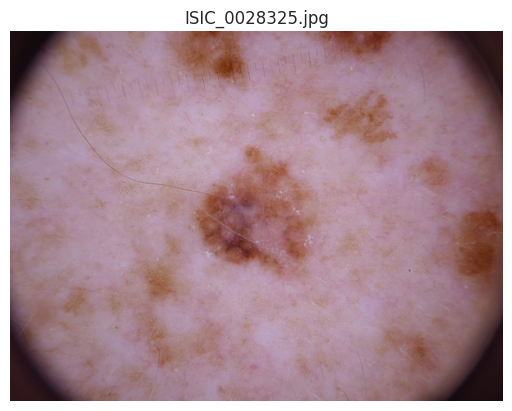

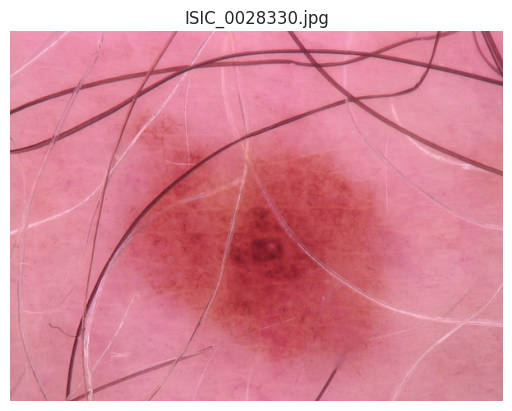

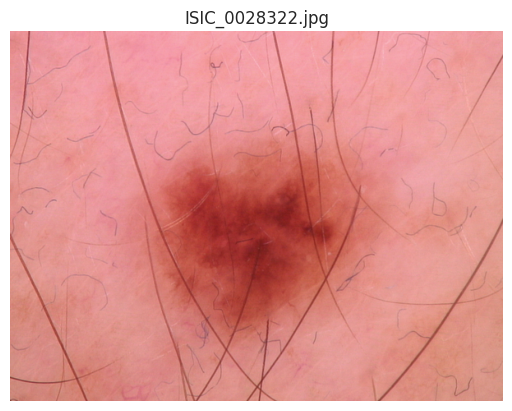

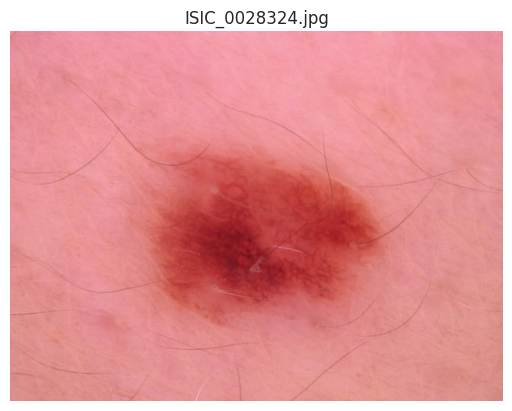

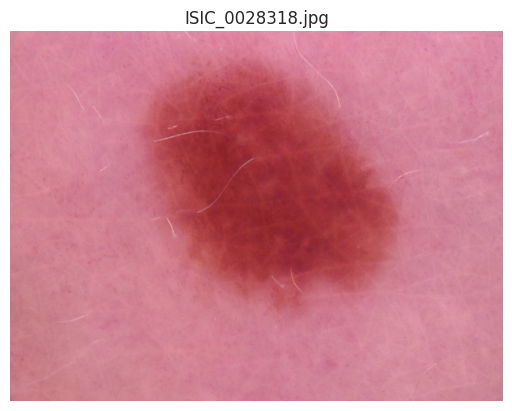

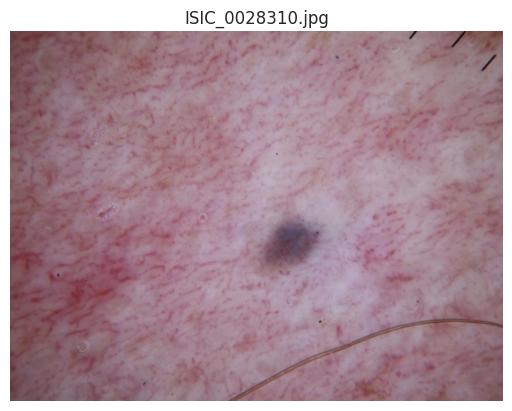

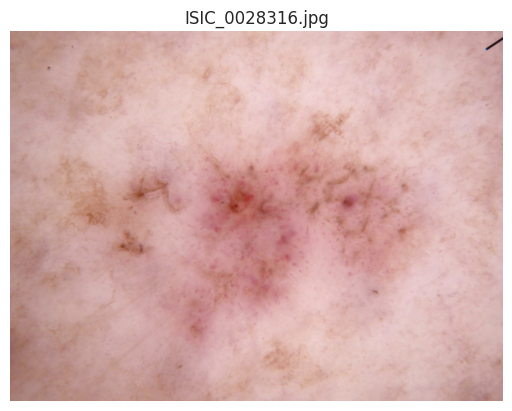

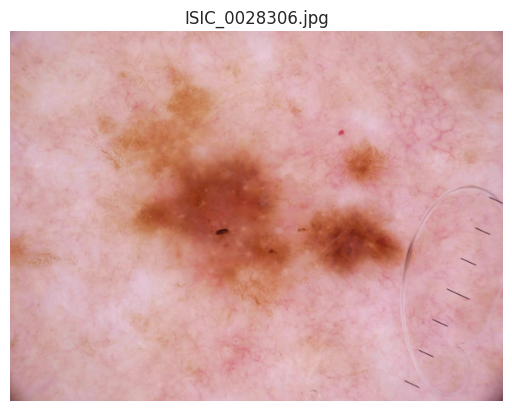

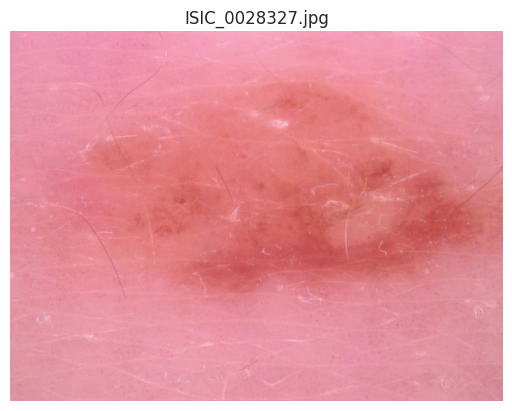

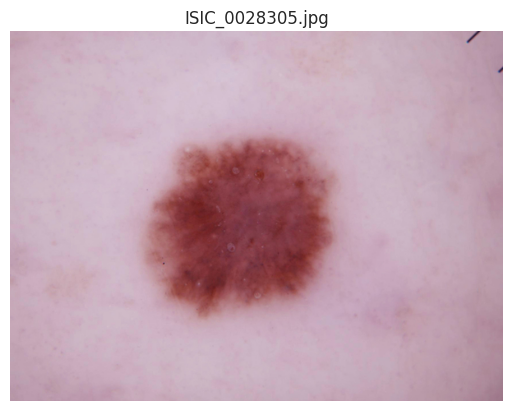

In [ ]:
#Loading the images and displaying first 10 images from 2 Image Folders
import os
from PIL import Image
import matplotlib.pyplot as plt

# Define the paths to your image folders
folder1 = '/content/drive/My Drive/projectsreq/Images/HAM10000_images_part_1'
folder2 = '/content/drive/My Drive/projectsreq/Images/HAM10000_images_part_2'

# Define allowed image extensions
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif')

# Function to recursively gather image files from a folder
def get_image_files(folder_path):
    image_files = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(image_extensions):
                image_files.append(os.path.join(root, file))
    return image_files

# Get image file lists for both folders
image_files_folder1 = get_image_files(folder1)
image_files_folder2 = get_image_files(folder2)

# Combine image lists from both folders
all_image_files = image_files_folder1 + image_files_folder2

print("Total images loaded:", len(all_image_files))

# Display only the first 10 images from the combined list
print("Displaying first 10 images:")
for image_path in all_image_files[:10]:
    img = Image.open(image_path)
    plt.imshow(img)
    plt.title(os.path.basename(image_path))
    plt.axis('off')
    plt.show()


<ipython-input-36-78dbf91b3b47>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='sex', data=df, palette=colors)


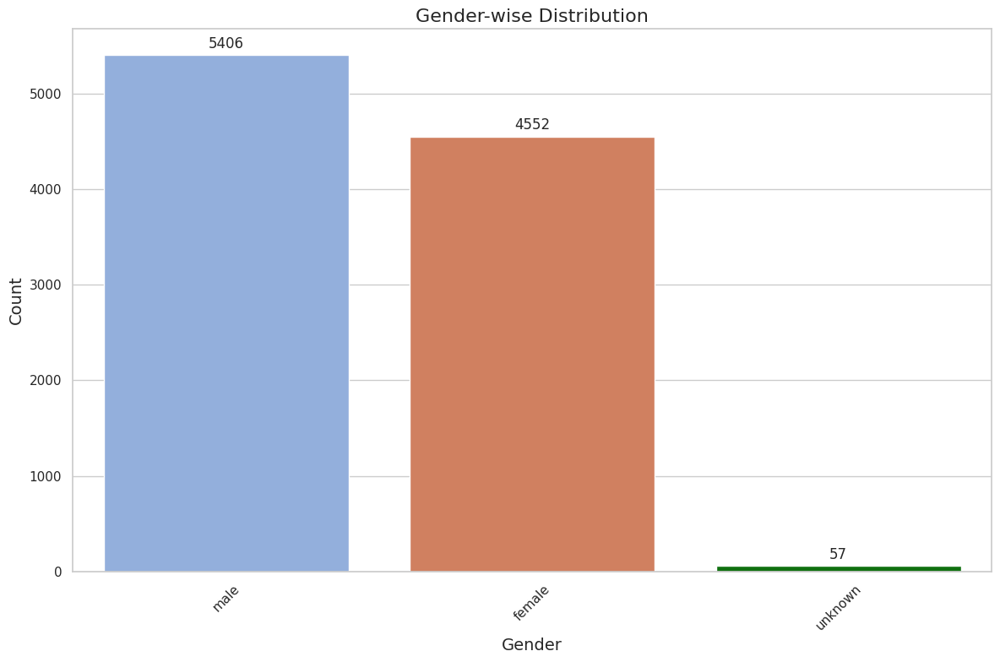

In [ ]:
# Data Exploration

# Gender Wise
sns.set_style('whitegrid')
colors = ['#87ace8', '#e3784d', 'green']
fig, ax = plt.subplots(figsize=(12,8))

ax = sns.countplot(x='sex', data=df, palette=colors)
for container in ax.containers:
    ax.bar_label(container, padding=3)
plt.title('Gender-wise Distribution', fontsize=16)
plt.xlabel('Gender', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



<ipython-input-27-dfb4bd4490a5>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='cell_type', data=df, order=df['cell_type'].value_counts().index, palette='Paired')


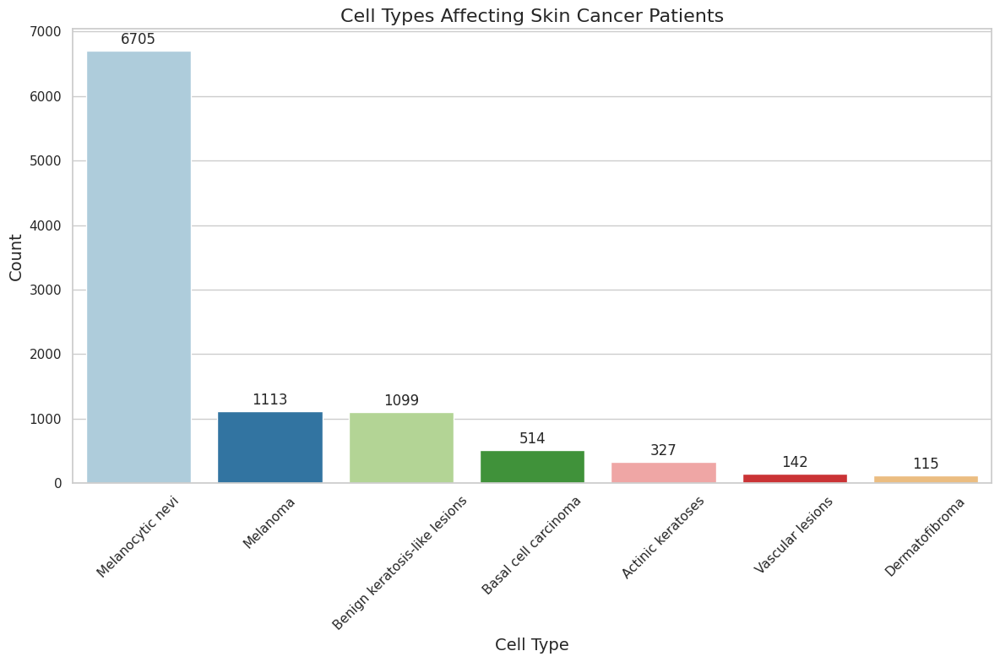

In [ ]:
# Cell type affect on Patients
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.countplot(x='cell_type', data=df, order=df['cell_type'].value_counts().index, palette='Paired')
for container in ax.containers:
    ax.bar_label(container, padding=3)
plt.title('Cell Types Affecting Skin Cancer Patients', fontsize=16)
plt.xlabel('Cell Type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




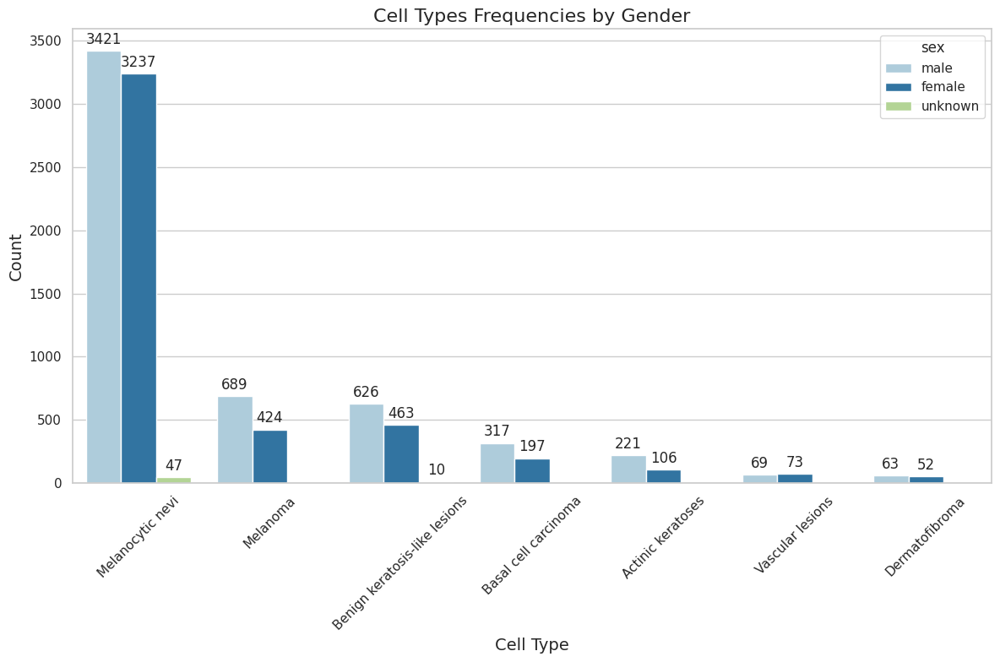

In [ ]:
#Gender vs Cell type
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.countplot(x='cell_type', hue='sex', data=df,
                   order=df['cell_type'].value_counts().index,
                   palette='Paired')
for container in ax.containers:
    ax.bar_label(container, padding=3)
plt.title('Cell Types Frequencies by Gender', fontsize=16)
plt.xlabel('Cell Type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<ipython-input-30-6c2b8e348ddb>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='dx_type', data=df,


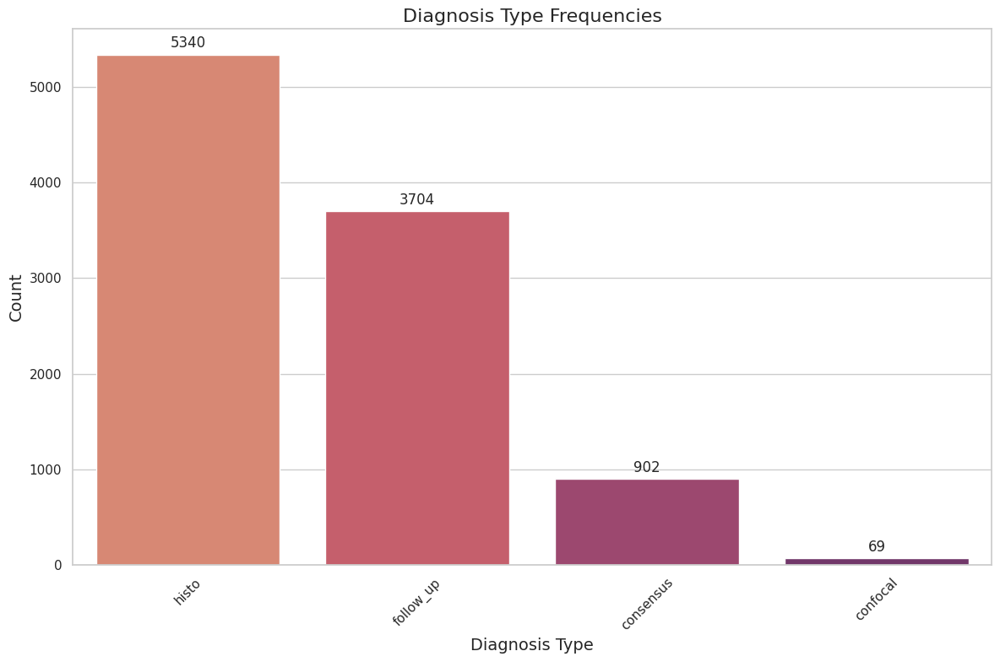

In [ ]:
# Cell Type
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.countplot(x='dx_type', data=df,
                   order=df['dx_type'].value_counts().index,
                   palette='flare')
for container in ax.containers:
    ax.bar_label(container, padding=3)
plt.title('Diagnosis Type Frequencies', fontsize=16)
plt.xlabel('Diagnosis Type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


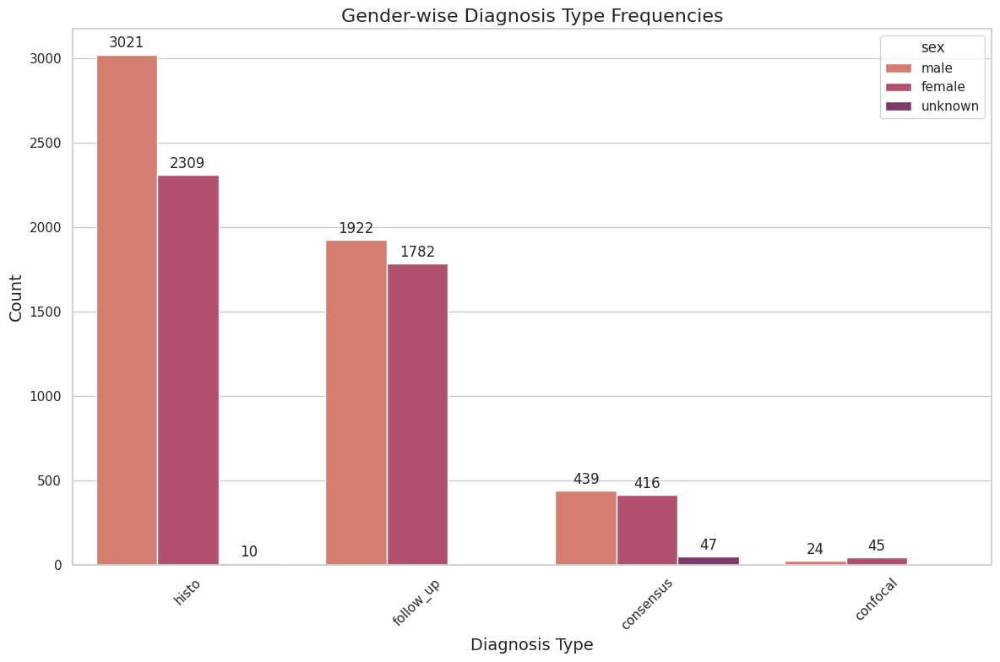

In [ ]:
#Gender wise Cell Type Distribution
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.countplot(x='dx_type', hue='sex', data=df,
                   order=df['dx_type'].value_counts().index,
                   palette='flare')
for container in ax.containers:
    ax.bar_label(container, padding=3)
plt.title('Gender-wise Diagnosis Type Frequencies', fontsize=16)
plt.xlabel('Diagnosis Type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<ipython-input-32-634da416875e>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='localization', data=df,


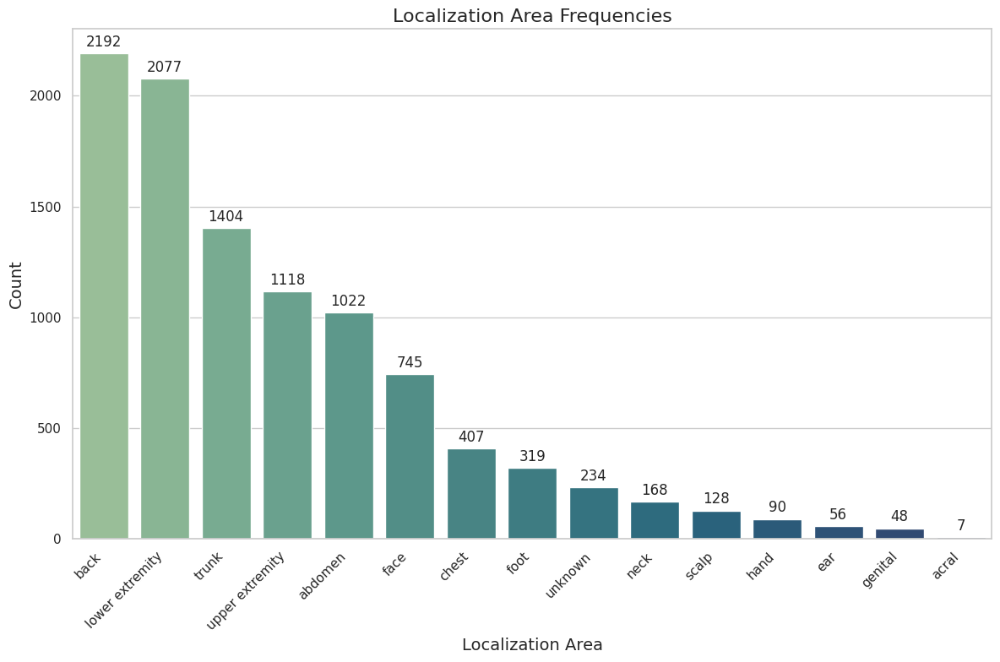

In [ ]:
# Localization area
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.countplot(x='localization', data=df,
                   order=df['localization'].value_counts().index,
                   palette='crest')
for container in ax.containers:
    ax.bar_label(container, padding=3)
plt.title('Localization Area Frequencies', fontsize=16)
plt.xlabel('Localization Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


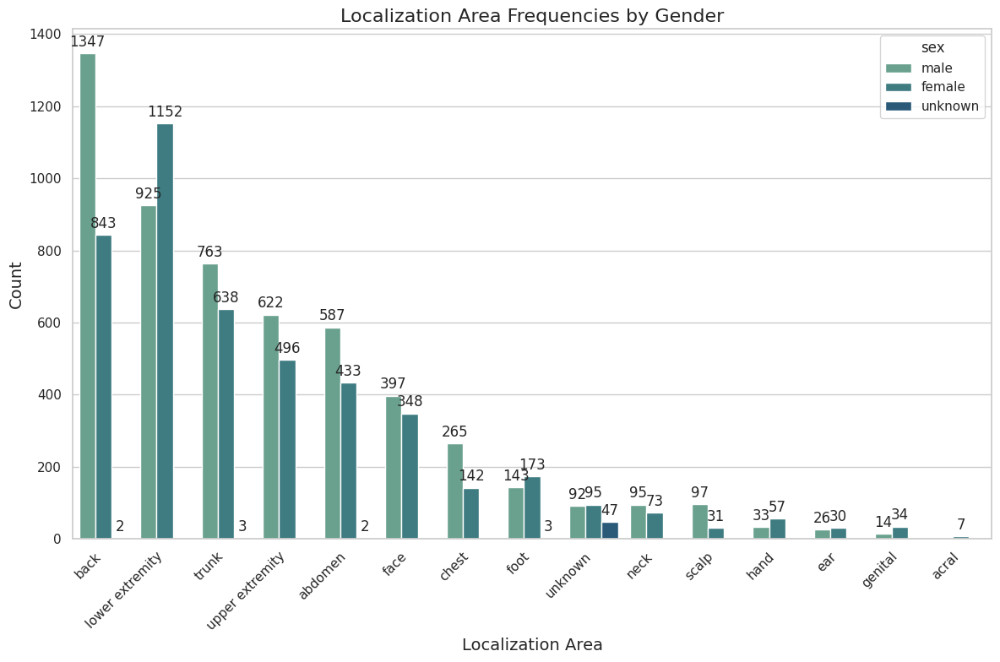

In [ ]:
# Genderwise localization areas
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.countplot(x='localization', hue='sex', data=df,
                   order=df['localization'].value_counts().index,
                   palette='crest')
for container in ax.containers:
    ax.bar_label(container, padding=3)
plt.title('Localization Area Frequencies by Gender', fontsize=16)
plt.xlabel('Localization Area', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


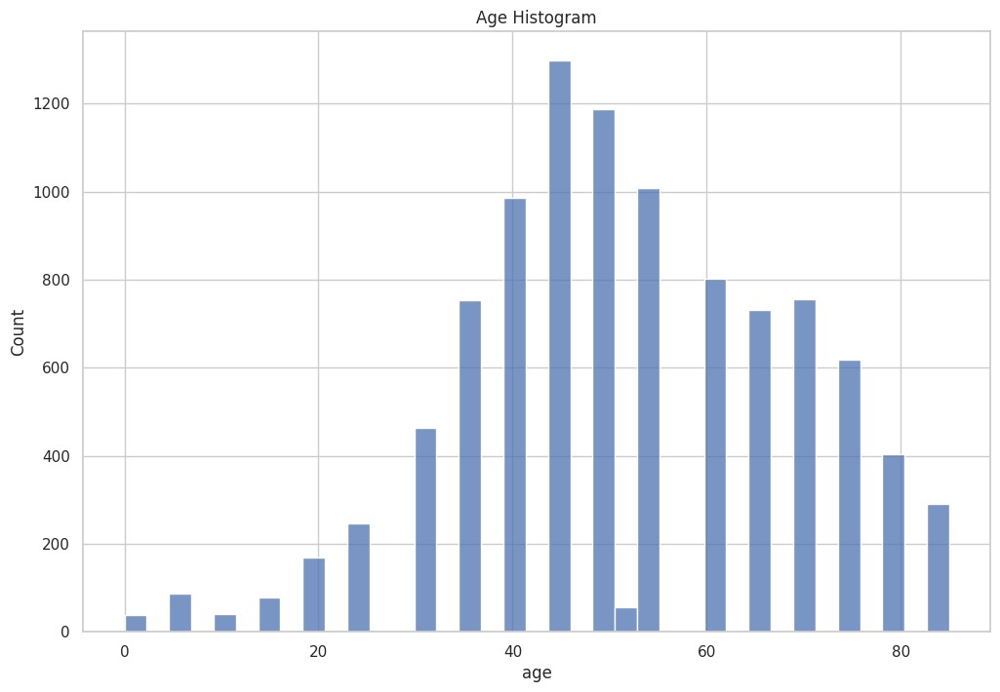

In [ ]:
#Age
sns.set_style('whitegrid')
fig,axes = plt.subplots(figsize=(12,8))
ax = sns.histplot(data=df, x='age')
plt.title('Age Histogram')
plt.show()

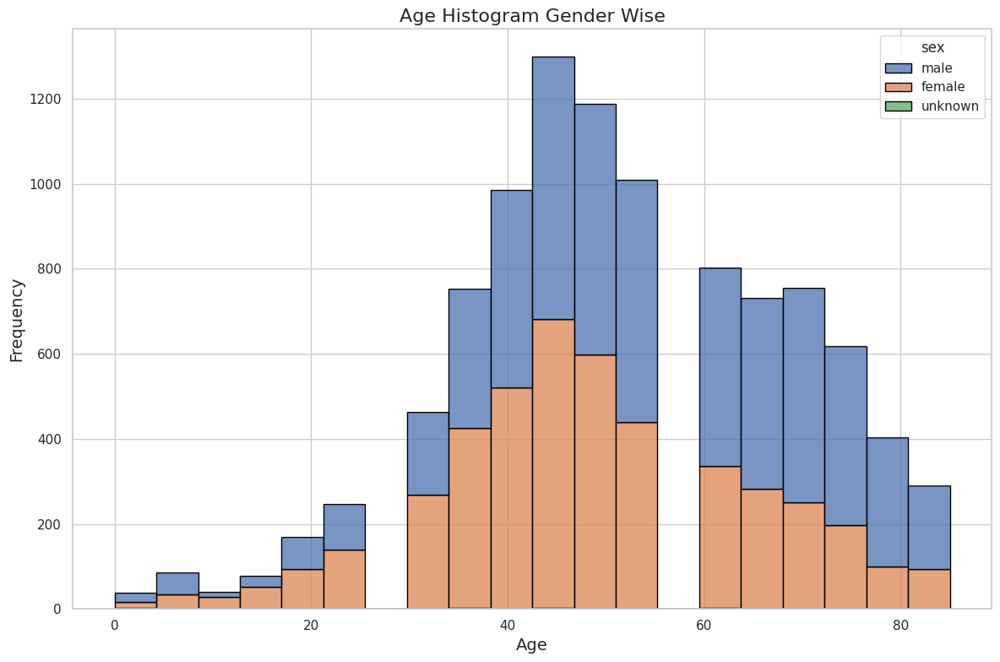

In [ ]:
# Gender wise Age distribution
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.histplot(data=df, x='age', hue='sex', multiple='stack', bins=20, edgecolor='black', palette='deep')
plt.title('Age Histogram Gender Wise', fontsize=16)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.tight_layout()
plt.show()


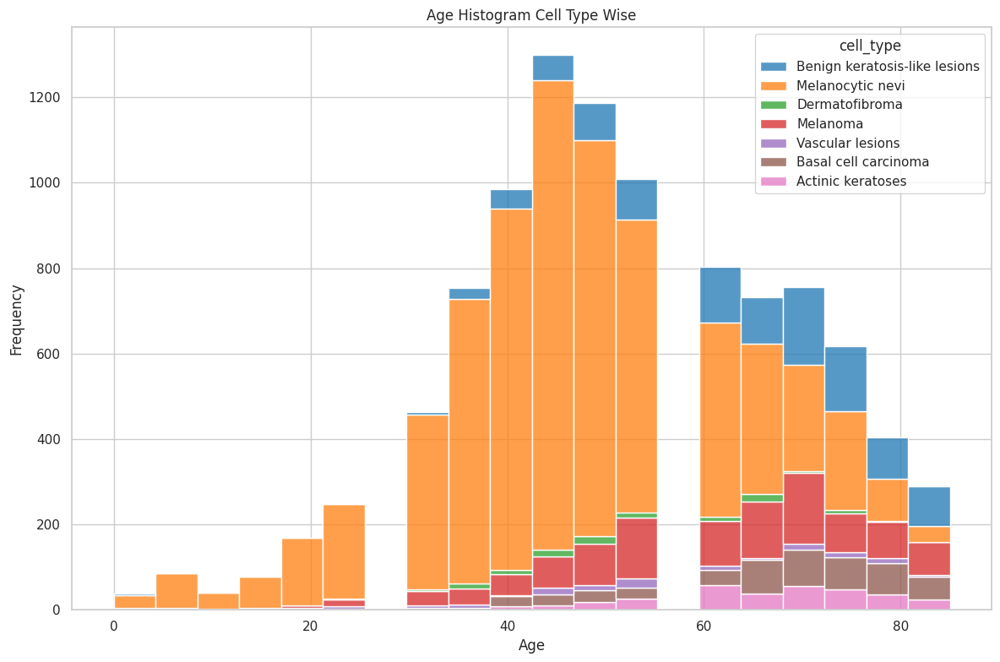

In [ ]:
#Cell Type vs Age
sns.set_style('whitegrid')
fig, axes = plt.subplots(figsize=(12,8))
custom_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
ax = sns.histplot(data=df, x='age', hue='cell_type', multiple='stack', bins=20, palette=custom_palette)
plt.title('Age Histogram Cell Type Wise')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()




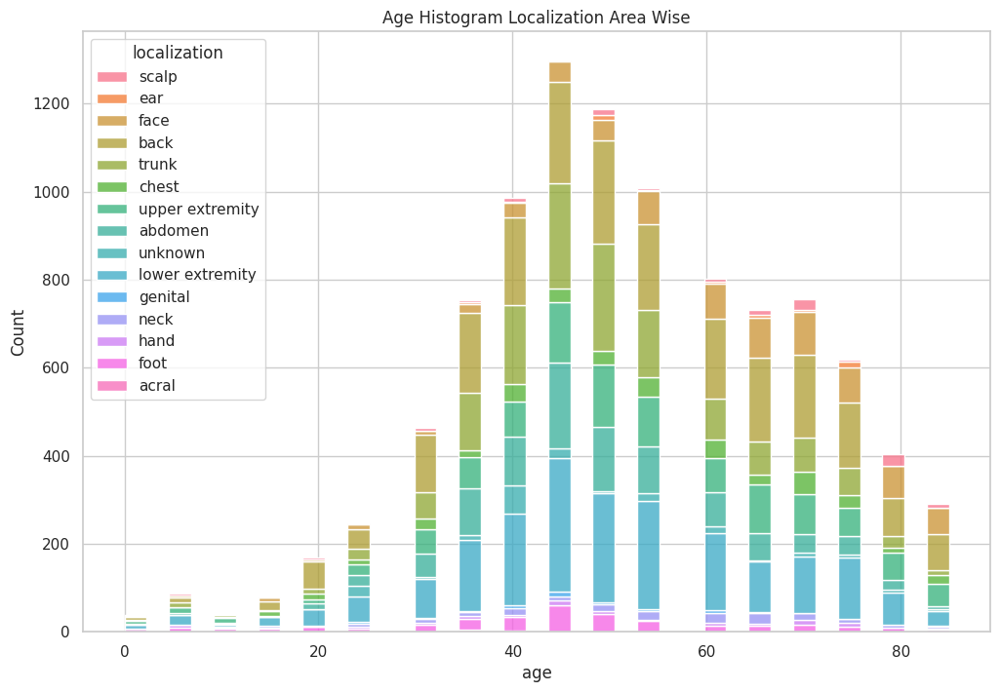

In [ ]:
# Localization Area vs Age
sns.set_style('whitegrid')
fig,axes = plt.subplots(figsize=(12,8))
ax = sns.histplot(data=df, x='age',hue='localization',multiple='stack')
plt.title('Age Histogram Localization Area Wise')
plt.show()

In [ ]:
!pip install -q faiss-cpu timm umap-learn
# !git clone https://github.com/facebookresearch/dino.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.3/31.3 MB 84.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 109.4 MB/s eta 0:00:00


In [ ]:
!pip install -q kagglehub faiss-cpu

In [ ]:
# Importing required libraries.
import os
import random
import torch
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import timm  # For pretrained ViT models
import kagglehub
from google.colab import drive
from torch.utils.data import Dataset, DataLoader
import glob
import timm
from tqdm import tqdm
import numpy as np
import torch.nn.functional as F
from torch.utils.data import Subset
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE

Mounts your Google Drive

Downloads the dataset using kagglehub (Run this step only if the last step gives error while loading the dataset because maybe the dataset is already there in the drive)

Moves it into your Drive for persistence

Loads the images into a PyTorch dataset

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


### 📁 Dataset Download & Storage (Brief Summary)

This code downloads the **HAM10000 skin cancer dataset** from **Kaggle** (if not already available) and copies it to your **Google Drive** for permanent access, avoiding the need to re-download it every time the notebook runs.


In [ ]:
# 3. Download dataset via KaggleHub (Optional if the next cell give any error)

# Download and extract dataset to temporary path (This code is t download the dataset for the first time and pasting in the google drive)
# temp_path = kagglehub.dataset_download("kmader/skin-cancer-mnist-ham10000")
# print("Dataset downloaded at:", temp_path)

# 4. Copy to Google Drive for permanent access
drive_dataset_path = "/content/drive/MyDrive/HAM10000_dino_dataset"

# Move to Google Drive (if not already moved)
if not os.path.exists(drive_dataset_path):
    !cp -r "$temp_path" "$drive_dataset_path"
    print("Dataset copied to Google Drive at:", drive_dataset_path)
else:
    print("Dataset already exists in Google Drive.")


Dataset already exists in Google Drive.


### 🧪 Data Preparation & Visualization Summary

- **Metadata & Paths:** Loads image metadata and combines image folders from Drive.
- **Class Balancing:** Undersamples the dominant 'nv' class to balance the dataset across all lesion types.
- **Image Path Mapping:** Maps each `image_id` to its actual `.jpg` path from both image folders.
- **Custom Dataset:** Creates a PyTorch-compatible `Dataset` class for image loading.
- **Transformations:** Applies resize, normalization, and tensor conversion for Vision Transformer (ViT) compatibility.
- **DataLoader:** Loads data in batches (64 images) with shuffling for training.
- **Visualization:** Displays a sample batch of 6 balanced and preprocessed images (224x224).

📌 Ensures clean, balanced input for deep learning models like ViT.


### 🧠 DINO ViT Training with Contrastive Learning

This section trains a **self-supervised DINO ViT model** using **contrastive learning** on a subset of the HAM10000 dataset.

---

#### ✅ Key Steps:

1. **Model Setup**  
   - Loads a pretrained `ViT-Base-Patch16-224` DINO model (from `timm`) and removes the classification head.

2. **Data Subsetting**  
   - Uses a random subset of 500 images from the balanced dataset to speed up training.

3. **Data Augmentation**  
   - Applies strong augmentations like random crops, color jitter, grayscale, and Gaussian blur to generate two different views of each image.

4. **Contrastive Loss Function**  
   - Compares feature vectors from augmented views and uses cross-entropy loss to align positive pairs.

5. **Training Loop**  
   - Runs for 100 epochs using the `AdamW` optimizer.
   - For each batch:
     - Two augmented views are generated.
     - Forward pass through the ViT encoder.
     - Contrastive loss is computed and used to update the model.

6. **Visualization**  
   - Plots training loss across all epochs to monitor learning progress.

---

📌 **Goal:** Learn robust image representations using unlabeled data by aligning views of the same image closer in feature space.


/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name vit_base_patch16_224_dino to current vit_base_patch16_224.dino.
  model = create_fn(
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Epoch 1/100: 100%|██████████| 54/54 [21:02<00:00, 23.39s/it]


Epoch 1/100, Loss: 118.9994


Epoch 2/100: 100%|██████████| 54/54 [02:28<00:00,  2.75s/it]


Epoch 2/100, Loss: 7.6034


Epoch 3/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 3/100, Loss: 4.5249


Epoch 4/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 4/100, Loss: 3.6757


Epoch 5/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 5/100, Loss: 3.1007


Epoch 6/100: 100%|██████████| 54/54 [02:30<00:00,  2.78s/it]


Epoch 6/100, Loss: 2.2085


Epoch 7/100: 100%|██████████| 54/54 [02:30<00:00,  2.78s/it]


Epoch 7/100, Loss: 2.0294


Epoch 8/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 8/100, Loss: 1.2631


Epoch 9/100: 100%|██████████| 54/54 [02:30<00:00,  2.78s/it]


Epoch 9/100, Loss: 1.1044


Epoch 10/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 10/100, Loss: 0.8243


Epoch 11/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 11/100, Loss: 0.9917


Epoch 12/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 12/100, Loss: 0.8541


Epoch 13/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 13/100, Loss: 0.8899


Epoch 14/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 14/100, Loss: 0.7769


Epoch 15/100: 100%|██████████| 54/54 [02:30<00:00,  2.80s/it]


Epoch 15/100, Loss: 0.5696


Epoch 16/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 16/100, Loss: 0.5712


Epoch 17/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 17/100, Loss: 0.6202


Epoch 18/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 18/100, Loss: 0.4006


Epoch 19/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 19/100, Loss: 0.4724


Epoch 20/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 20/100, Loss: 0.5057


Epoch 21/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 21/100, Loss: 0.5263


Epoch 22/100: 100%|██████████| 54/54 [02:30<00:00,  2.78s/it]


Epoch 22/100, Loss: 0.3476


Epoch 23/100: 100%|██████████| 54/54 [02:29<00:00,  2.78s/it]


Epoch 23/100, Loss: 0.2775


Epoch 24/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 24/100, Loss: 0.3580


Epoch 25/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 25/100, Loss: 0.3193


Epoch 26/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 26/100, Loss: 0.4275


Epoch 27/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 27/100, Loss: 0.4142


Epoch 28/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 28/100, Loss: 0.3791


Epoch 29/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 29/100, Loss: 0.2536


Epoch 30/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 30/100, Loss: 0.3668


Epoch 31/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 31/100, Loss: 0.3300


Epoch 32/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 32/100, Loss: 0.3034


Epoch 33/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 33/100, Loss: 0.2574


Epoch 34/100: 100%|██████████| 54/54 [02:33<00:00,  2.84s/it]


Epoch 34/100, Loss: 0.2097


Epoch 35/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 35/100, Loss: 0.2370


Epoch 36/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 36/100, Loss: 0.2270


Epoch 37/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 37/100, Loss: 0.1682


Epoch 38/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 38/100, Loss: 0.2635


Epoch 39/100: 100%|██████████| 54/54 [02:29<00:00,  2.77s/it]


Epoch 39/100, Loss: 0.2765


Epoch 40/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 40/100, Loss: 0.1939


Epoch 41/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 41/100, Loss: 0.1607


Epoch 42/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 42/100, Loss: 0.1967


Epoch 43/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 43/100, Loss: 0.2961


Epoch 44/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 44/100, Loss: 0.1510


Epoch 45/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 45/100, Loss: 0.2272


Epoch 46/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 46/100, Loss: 0.2911


Epoch 47/100: 100%|██████████| 54/54 [02:29<00:00,  2.77s/it]


Epoch 47/100, Loss: 0.1879


Epoch 48/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 48/100, Loss: 0.2071


Epoch 49/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 49/100, Loss: 0.2143


Epoch 50/100: 100%|██████████| 54/54 [02:29<00:00,  2.77s/it]


Epoch 50/100, Loss: 0.1685


Epoch 51/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 51/100, Loss: 0.1675


Epoch 52/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 52/100, Loss: 0.1844


Epoch 53/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 53/100, Loss: 0.1099


Epoch 54/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 54/100, Loss: 0.1134


Epoch 55/100: 100%|██████████| 54/54 [02:30<00:00,  2.80s/it]


Epoch 55/100, Loss: 0.1178


Epoch 56/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 56/100, Loss: 0.1920


Epoch 57/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 57/100, Loss: 0.1764


Epoch 58/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 58/100, Loss: 0.2113


Epoch 59/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 59/100, Loss: 0.2321


Epoch 60/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 60/100, Loss: 0.1434


Epoch 61/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 61/100, Loss: 0.1568


Epoch 62/100: 100%|██████████| 54/54 [02:30<00:00,  2.78s/it]


Epoch 62/100, Loss: 0.2267


Epoch 63/100: 100%|██████████| 54/54 [02:30<00:00,  2.78s/it]


Epoch 63/100, Loss: 0.2189


Epoch 64/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 64/100, Loss: 0.1293


Epoch 65/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 65/100, Loss: 0.1557


Epoch 66/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 66/100, Loss: 0.1791


Epoch 67/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 67/100, Loss: 0.1616


Epoch 68/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 68/100, Loss: 0.1339


Epoch 69/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 69/100, Loss: 0.1953


Epoch 70/100: 100%|██████████| 54/54 [02:30<00:00,  2.78s/it]


Epoch 70/100, Loss: 0.1692


Epoch 71/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 71/100, Loss: 0.1337


Epoch 72/100: 100%|██████████| 54/54 [02:29<00:00,  2.77s/it]


Epoch 72/100, Loss: 0.1512


Epoch 73/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 73/100, Loss: 0.1612


Epoch 74/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 74/100, Loss: 0.1447


Epoch 75/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 75/100, Loss: 0.1516


Epoch 76/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 76/100, Loss: 0.1233


Epoch 77/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 77/100, Loss: 0.1206


Epoch 78/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 78/100, Loss: 0.1379


Epoch 79/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 79/100, Loss: 0.0963


Epoch 80/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 80/100, Loss: 0.1001


Epoch 81/100: 100%|██████████| 54/54 [02:32<00:00,  2.82s/it]


Epoch 81/100, Loss: 0.1410


Epoch 82/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 82/100, Loss: 0.0839


Epoch 83/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 83/100, Loss: 0.1497


Epoch 84/100: 100%|██████████| 54/54 [02:30<00:00,  2.78s/it]


Epoch 84/100, Loss: 0.1340


Epoch 85/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 85/100, Loss: 0.1130


Epoch 86/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 86/100, Loss: 0.1099


Epoch 87/100: 100%|██████████| 54/54 [02:33<00:00,  2.84s/it]


Epoch 87/100, Loss: 0.1653


Epoch 88/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 88/100, Loss: 0.1347


Epoch 89/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 89/100, Loss: 0.1184


Epoch 90/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 90/100, Loss: 0.0941


Epoch 91/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 91/100, Loss: 0.0920


Epoch 92/100: 100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


Epoch 92/100, Loss: 0.0866


Epoch 93/100: 100%|██████████| 54/54 [02:32<00:00,  2.83s/it]


Epoch 93/100, Loss: 0.0707


Epoch 94/100: 100%|██████████| 54/54 [02:29<00:00,  2.77s/it]


Epoch 94/100, Loss: 0.0853


Epoch 95/100: 100%|██████████| 54/54 [02:31<00:00,  2.80s/it]


Epoch 95/100, Loss: 0.0837


Epoch 96/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 96/100, Loss: 0.1006


Epoch 97/100: 100%|██████████| 54/54 [02:32<00:00,  2.81s/it]


Epoch 97/100, Loss: 0.0665


Epoch 98/100: 100%|██████████| 54/54 [02:33<00:00,  2.84s/it]


Epoch 98/100, Loss: 0.1023


Epoch 99/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]


Epoch 99/100, Loss: 0.0939


Epoch 100/100: 100%|██████████| 54/54 [02:30<00:00,  2.79s/it]

Epoch 100/100, Loss: 0.1067


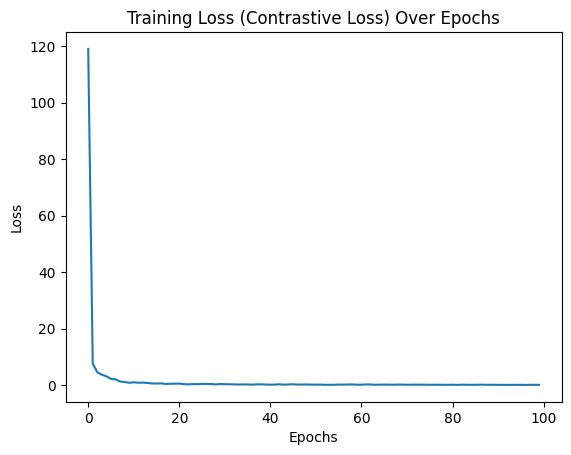

In [ ]:
from torchvision.transforms import RandomResizedCrop, RandomHorizontalFlip, ColorJitter, RandomGrayscale, GaussianBlur, RandomApply, ToTensor, Normalize, Compose
# Load the dataset and dataloader (same as in previous steps)
num_samples = 500  # Number of samples to use
indices = random.sample(range(len(dataset)), num_samples)
subset = Subset(dataset, indices)
dataloaderfortraining = DataLoader(subset, batch_size=32, shuffle=True, num_workers=4)
# === Step 1: Load DINO ViT model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model("vit_base_patch16_224_dino", pretrained=True)
model.head = torch.nn.Identity()  # Remove classification head
model = model.to(device)

# === Step 2: Set up contrastive loss function ===
# DINO uses a contrastive loss that compares the feature vectors of augmented views of the same image
def contrastive_loss(x1, x2, temperature=0.07):
    # Compute the similarity between the two views
    sim = torch.matmul(x1, x2.T) / temperature  # Shape: [batch_size, batch_size]
    sim = sim - torch.max(sim, dim=1, keepdim=True)[0]  # Normalize for numerical stability

    # Compute the cross-entropy loss
    labels = torch.arange(x1.size(0)).to(device)
    loss = F.cross_entropy(sim, labels)
    return loss

# === Step 3: Data augmentations for contrastive learning ===
train_transform = Compose([
    RandomResizedCrop(224, scale=(0.2, 1.0)),  # DINO uses scale range for crops
    RandomHorizontalFlip(p=0.5),
    RandomApply([ColorJitter(0.4, 0.4, 0.4, 0.1)], p=0.8),
    RandomGrayscale(p=0.2),
    RandomApply([GaussianBlur(kernel_size=23)], p=0.5),
    ToTensor(),
    Normalize([0.5] * 3, [0.5] * 3),
])

# === Step 4: Training Loop (Fixed) ===
epochs = 100  # Adjust to 100-150 epochs
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4,weight_decay=1e-4)  # AdamW optimizer for DINO

# Store the loss for visualization later
train_losses = []

to_pil = ToPILImage()
#this is the code epochs are mentioned above the epochs will run and then model will train on the dataset we have made above
for epoch in range(epochs):
    model.train()
    epoch_loss = 0.0
    num_batches = 0
#used TQDM we can also use range function but TQDM is scaled and optimized used in Deep learning
    for batch in tqdm(dataloader, desc=f"Epoch {epoch + 1}/{epochs}"):
        batch = batch.to(device)

        # Create augmentations (two different views)
        view1 = torch.stack([train_transform(to_pil(image)) for image in batch])  # Convert to PIL first, then apply transform
        view2 = torch.stack([train_transform(to_pil(image)) for image in batch])  # Convert to PIL first, then apply transform

        view1 = view1.to(device)
        view2 = view2.to(device)

        # Forward pass
        output1 = model(view1)
        output2 = model(view2)

        # Calculate contrastive loss (cross-view prediction loss)
        loss = contrastive_loss(output1, output2)

        optimizer.zero_grad()  # Clear previous gradients
        loss.backward()  # Backpropagation
        optimizer.step()  # Update model parameters

        epoch_loss += loss.item()
        num_batches += 1

    # Average loss for the epoch
    avg_epoch_loss = epoch_loss / num_batches
    train_losses.append(avg_epoch_loss)
    print(f"Epoch {epoch + 1}/{epochs}, Loss: {avg_epoch_loss:.4f}")

# === Step 5: Visualize Training Loss ===

plt.plot(train_losses)
plt.title('Training Loss (Contrastive Loss) Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

### 📦 Feature Extraction using DINO ViT

This block extracts deep features from all balanced images using the trained **DINO ViT** model.

---

#### 🔍 How it works:
- Iterates over the dataloader in batches.
- Passes each batch through the ViT encoder (without gradients using `torch.no_grad()`).
- Extracted features (of size `768` per image) are stored.
- Finally, all batch-wise features are concatenated into a single tensor.

```python
All features shape: [num_images, 768]


In [ ]:
# Store all features
all_features = []
#below code takes batches from the dataset dataloader
#give the image to the model and takes the output from the model which are features that we needed
#then appending those features to the array
with torch.no_grad():
    for batch in tqdm(dataloader, desc="Extracting features"):
        batch = batch.to(device)
        features = model(batch)  # shape: [batch_size, 768]
        all_features.append(features.cpu())

# Concatenate all batches into a single tensor
all_features = torch.cat(all_features, dim=0)  # shape: [10015, 768]
print("All features shape:", all_features.shape)


Extracting features: 100%|██████████| 54/54 [00:20<00:00,  2.70it/s]

All features shape: torch.Size([3425, 768])


### 💾 Save Extracted Features (Optional but Recommended)

This step saves the extracted DINO features to Google Drive for **future reuse**, avoiding the need to re-extract features every time.

---

#### ✅ Why save?
- Saves time for future experiments.
- Allows reuse in tasks like clustering, t-SNE, or classification without running the model again.

```python
Saved Path: /content/drive/MyDrive/HAM10000_dino_dataset/ham10000_finetuned_balanced_dino_features.pt

In [ ]:
# Save features to Drive (optional but recommended for reuse)
feature_save_path = "/content/drive/MyDrive/HAM10000_dino_dataset/ham10000_finetuned_balanced_transformed_features.pt"
torch.save(all_features, feature_save_path)
print("Features saved to:", feature_save_path)

Features saved to: /content/drive/MyDrive/HAM10000_dino_dataset/ham10000_finetuned_balanced_transformed_features.pt


### 🔄 Reload Saved Features (Optional)

If features were previously saved, you can reload them directly from Google Drive to avoid re-extracting.

---

#### 📂 Load Path:
```python
/content/drive/MyDrive/HAM10000_dino_dataset/ham10000_finetuned_balanced_dino_features.pt

In [ ]:
# Reload features if not already in memory
feature_save_path = "/content/drive/MyDrive/HAM10000_dino_dataset/ham10000_finetuned_balanced_transformed_features.pt"
all_features = torch.load(feature_save_path)
print("Loaded feature shape:", all_features.shape)


Loaded feature shape: torch.Size([3425, 768])


### 📊 PCA Visualization of Extracted DINO Features

We reduce the dimensionality of the 768-dimensional DINO features using PCA to:

- 🔹 **2D** for simple scatter plotting
- 🔹 **3D** for richer spatial visualization

---

#### ✅ Steps:
- Convert PyTorch tensor to NumPy
- Apply PCA with `n_components=2` and `3`
- Visualize using `matplotlib` (2D + 3D)

📌 Helps understand the clustering or spread of learned features visually.


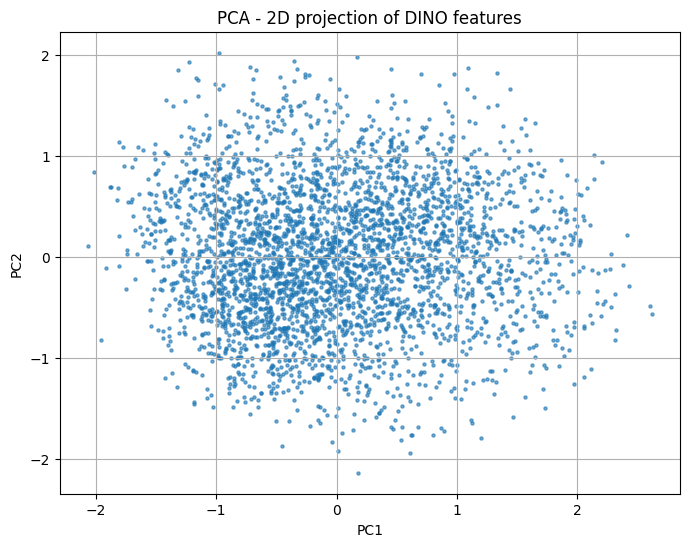

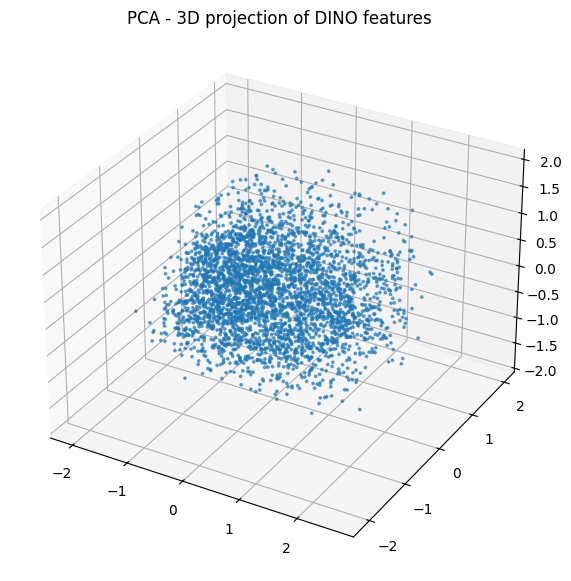

In [ ]:
# Convert to numpy
features_np = all_features.numpy()

# Apply PCA
pca_2d = PCA(n_components=2).fit_transform(features_np)
pca_3d = PCA(n_components=3).fit_transform(features_np)

# Plot PCA (2D)
plt.figure(figsize=(8, 6))
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], s=5, alpha=0.6)
plt.title("PCA - 2D projection of DINO features")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.show()

# Plot PCA (3D)
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_3d[:, 0], pca_3d[:, 1], pca_3d[:, 2], s=3, alpha=0.6)
ax.set_title("PCA - 3D projection of DINO features")
plt.show()

### 🎨 PCA Visualization with Cancer Type Labels (HAM10000)

Now that we have extracted the DINO features and reduced their dimensionality using PCA, we visualize them **with color-coded labels** to understand how well different skin lesion types separate in feature space.

---

#### ✅ Steps:
1. **Load metadata CSV**: Contains `image_id` and `diagnosis` (`dx`) columns.
2. **Map image IDs to labels**: Using image filenames.
3. **Encode labels**: Assign unique integer IDs to each diagnosis class.
4. **Apply consistent color palette**: For visual clarity.
5. **Plot PCA**:
   - 🟦 **2D Scatter**: Using Seaborn for labeled clustering
   - 🟥 **3D Scatter**: With matplotlib for deeper spatial understanding

---

📌 This visualization reveals **how distinct (or overlapping)** the different cancer types are in the learned feature space — useful for evaluating **feature separability** from self-supervised models like DINO.


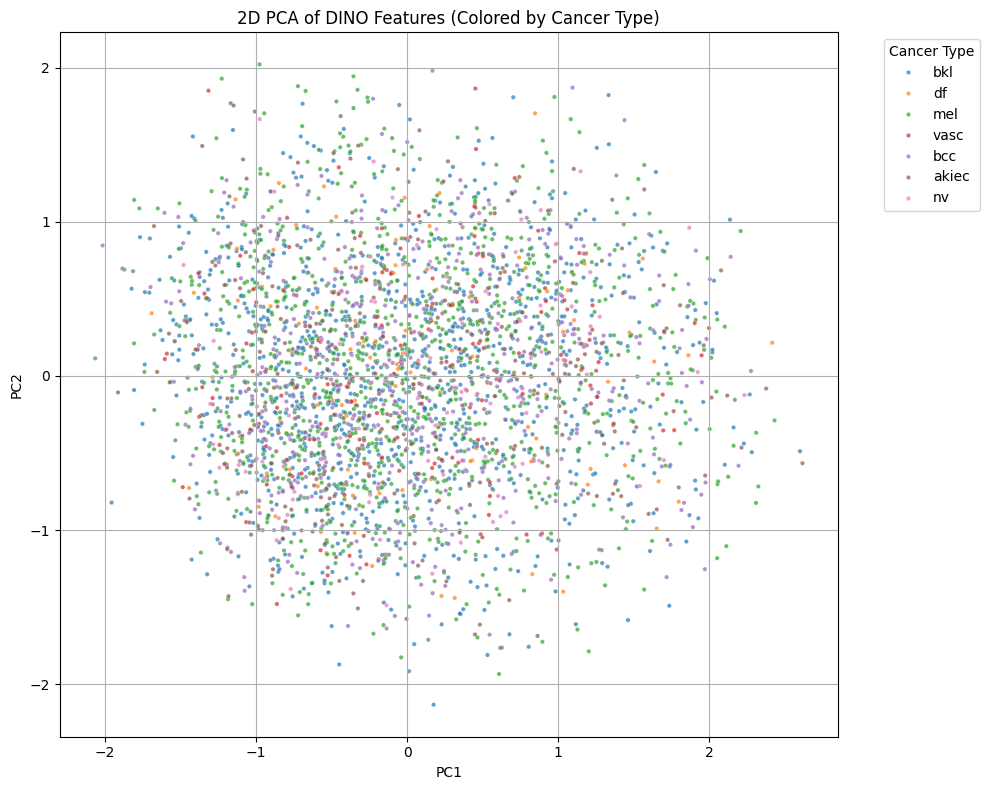

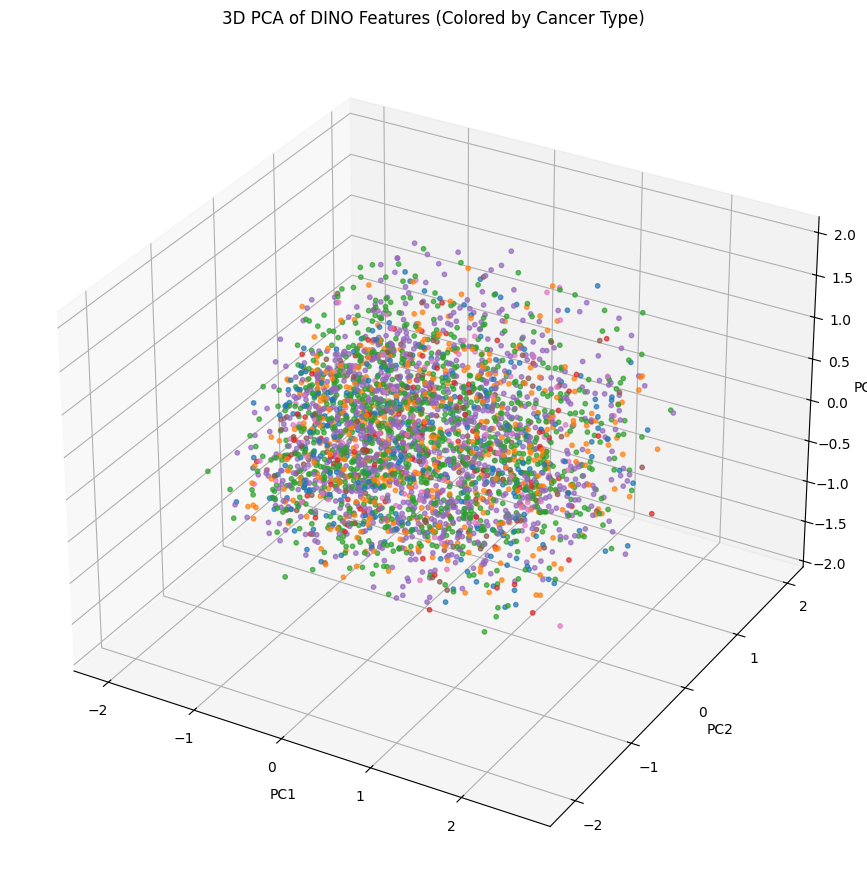

In [ ]:
# === STEP 1: Load metadata CSV ===
meta_path = os.path.join(drive_dataset_path, "HAM10000_metadata.csv")
metadata = pd.read_csv(meta_path)

# Map image_id → label
id_to_label = dict(zip(metadata['image_id'], metadata['dx']))

# === STEP 2: Get labels for your images ===
labels = []
for img_path in image_files:
    image_id = os.path.splitext(os.path.basename(img_path))[0]
    labels.append(id_to_label.get(image_id, "unknown"))

# === STEP 3: Encode labels to integers for coloring ===
unique_labels = sorted(set(labels))
label_to_idx = {label: idx for idx, label in enumerate(unique_labels)}
label_indices = [label_to_idx[l] for l in labels]

# Optional: Use consistent color palette
palette = sns.color_palette("tab10", n_colors=len(unique_labels))

# === STEP 4: 2D PCA Plot (colored by diagnosis) ===
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=pca_2d[:, 0], y=pca_2d[:, 1],
    hue=labels,
    palette=palette,
    s=10, alpha=0.7
)
plt.title("2D PCA of DINO Features (Colored by Cancer Type)")
plt.legend(title="Cancer Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.tight_layout()
plt.show()

# === STEP 5: 3D PCA Plot (colored by diagnosis) ===
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Assign colors
colors = [palette[label_to_idx[label]] for label in labels]

# Plot in 3D
ax.scatter(
    pca_3d[:, 0], pca_3d[:, 1], pca_3d[:, 2],
    c=colors, s=10, alpha=0.7
)

ax.set_title("3D PCA of DINO Features (Colored by Cancer Type)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.tight_layout()
plt.show()

### 🔍 t-SNE Visualization on DINO Features

In this step, we apply **t-SNE (t-distributed Stochastic Neighbor Embedding)** to further explore the **high-dimensional** DINO features. t-SNE is a powerful dimensionality reduction technique that focuses on preserving local similarities, making it ideal for visualizing clusters or groups within the data.

#### ✅ Steps:
1. **Subsample data**: As t-SNE can be slow for large datasets, we use a smaller subset (`2000` samples here).
2. **Run t-SNE**:
   - **Perplexity**: Set to 30, which balances local and global structure.
   - **Learning rate**: Affects optimization speed; 200 is a reasonable value.
3. **Visualize**: Scatter plot of the t-SNE output to observe potential clustering of different cancer types.

---

📌 **Insights**:
- If distinct clusters are formed, it suggests that the DINO features might have captured useful representations for distinguishing different skin lesion types.
- A **well-separated** scatterplot would indicate clear **discriminative power** in the feature space, whereas **overlap** suggests further refinement may be needed.

⚠️ t-SNE is sensitive to the number of samples and the random initialization, so results may vary.


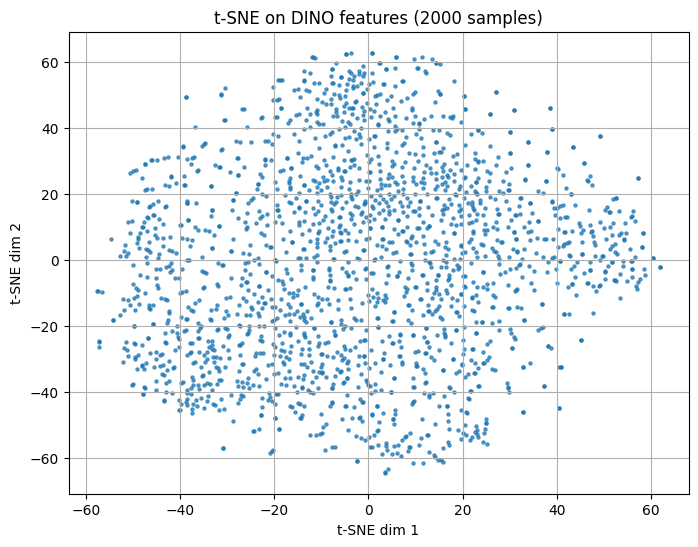

In [ ]:
# Run t-SNE (slow! you can subsample if needed)
subset_size = 2000  # you can use 5000 if Colab Pro handles it well
tsne_features = TSNE(n_components=2, perplexity=30, learning_rate=200, init="pca", random_state=42).fit_transform(features_np[:subset_size])

# Plot t-SNE
plt.figure(figsize=(8, 6))
plt.scatter(tsne_features[:, 0], tsne_features[:, 1], s=5, alpha=0.7)
plt.title(f"t-SNE on DINO features ({subset_size} samples)")
plt.xlabel("t-SNE dim 1")
plt.ylabel("t-SNE dim 2")
plt.grid(True)
plt.show()

<ipython-input-12-fb61f9fe37df>:16: UserWarning: The palette list has more values (7) than needed (3), which may not be intended.
  sns.scatterplot(


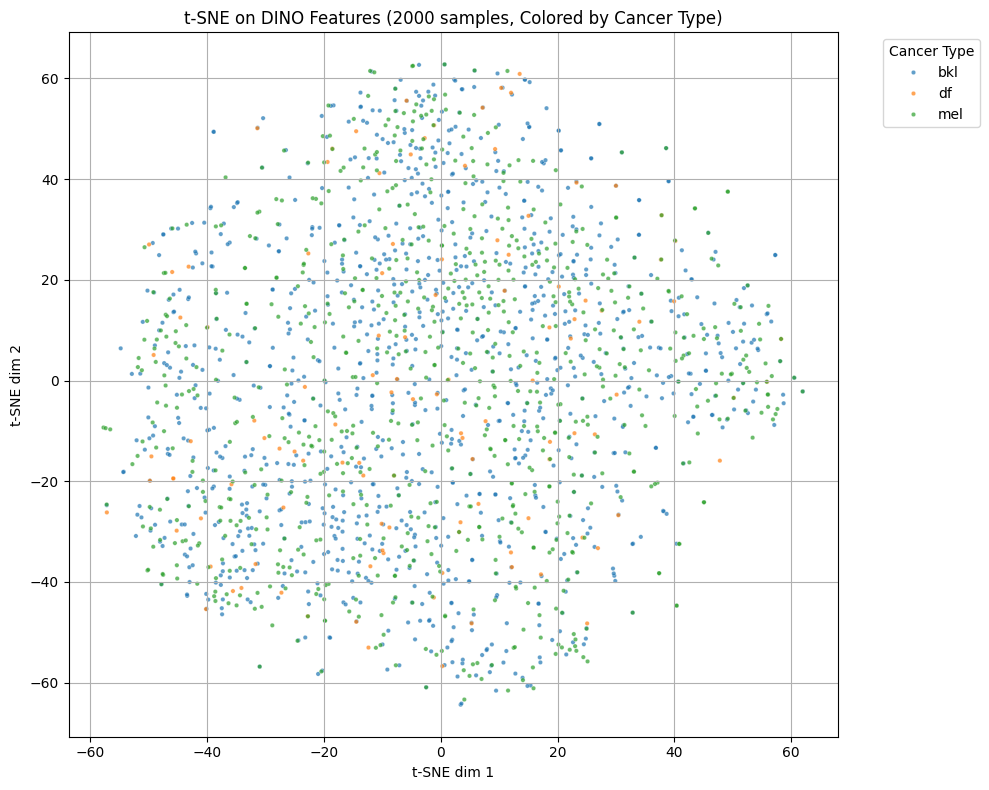

In [ ]:
# === STEP 1: Run t-SNE ===
# Use a subset of data for speed (e.g., 2000 samples)
subset_size = 2000  # Can adjust based on your system's capacity
tsne_features = TSNE(n_components=2, perplexity=30, learning_rate=200, init="pca", random_state=42).fit_transform(features_np[:subset_size])

# === STEP 2: Encode labels for coloring (same as before) ===
# Encode labels to integers for coloring
labels_subset = labels[:subset_size]  # Use the same subset of labels
label_indices_subset = [label_to_idx[l] for l in labels_subset]

# Optional: Use a consistent color palette
palette = sns.color_palette("tab10", n_colors=len(unique_labels))

# === STEP 3: Plot t-SNE (colored by diagnosis) ===
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=tsne_features[:, 0], y=tsne_features[:, 1],
    hue=labels_subset,  # Color by the actual cancer type labels
    palette=palette,
    s=10, alpha=0.7
)
plt.title(f"t-SNE on DINO Features ({subset_size} samples, Colored by Cancer Type)")
plt.legend(title="Cancer Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel("t-SNE dim 1")
plt.ylabel("t-SNE dim 2")
plt.grid(True)
plt.tight_layout()
plt.show()

### AttentionExtractor Class

The `AttentionExtractor` class is designed to extract attention maps from a Vision Transformer (ViT) model. Below is a breakdown of its key components:

#### 1. **Initialization (`__init__`)**
- **Input:** Takes a pre-trained `vit_model` as input (typically a Vision Transformer model).
- **Purpose:** Initializes the model and prepares for capturing attention maps.
- **Key Variable:**
  - `self.attn_maps`: An empty list that will store the attention maps.
- **Action:** Registers a forward hook on each transformer block's attention layer. The hook calls the `save_attn` method after the forward pass to capture the attention maps.

#### 2. **Saving Attention Maps (`save_attn`)**
- **Trigger:** This method is triggered during the forward pass of each transformer block.
- **Action:**
  - Checks if the module has `attn_drop` and `qkv` attributes (indicating a multi-head self-attention layer).
  - Extracts the `qkv` tensor, which contains queries (Q), keys (K), and values (V), and reshapes it.
  - The queries and keys are permuted and used to calculate attention scores via the dot product (`q @ k.transpose(-2, -1)`), scaled by the square root of the key dimension (`sqrt(d_k)`).
  - The attention scores are passed through a softmax function to obtain the attention probabilities.
- **Output:** The attention probabilities (`attn_probs`) are appended to `self.attn_maps`.

#### 3. **Forward Pass (`forward`)**
- **Action:**
  - Clears the `attn_maps` list to ensure that old attention maps do not persist.
  - The input tensor `x` is passed through the ViT model to trigger the forward pass and capture attention maps.
- **Output:** Returns the list of captured attention maps (`self.attn_maps`).

### Summary:
This class allows you to extract and visualize the attention maps from each transformer block in a Vision Transformer model by registering a forward hook. The attention maps represent how each token (image patch) attends to other tokens in the self-attention layers.


In [ ]:
class AttentionExtractor(torch.nn.Module):
    def __init__(self, vit_model):
        super().__init__()
        self.model = vit_model
        self.attn_maps = []

        # Register hook on each transformer block
        for block in self.model.blocks:
            block.attn.register_forward_hook(self.save_attn)

    def save_attn(self, module, input, output):
        # This gives the attention scores before softmax
        # 'output' here is attn_output, not the weights
        # So instead, we manually extract using qkv if needed
        if hasattr(module, 'attn_drop') and hasattr(module, 'qkv'):
            B, N, C = input[0].shape
            qkv = module.qkv(input[0]).reshape(B, N, 3, module.num_heads, C // module.num_heads)
            q, k, v = qkv[:, :, 0], qkv[:, :, 1], qkv[:, :, 2]

            q = q.permute(0, 2, 1, 3)  # [B, heads, tokens, dim]
            k = k.permute(0, 2, 1, 3)

            attn_scores = (q @ k.transpose(-2, -1)) * (1.0 / (q.shape[-1] ** 0.5))  # [B, heads, tokens, tokens]
            attn_probs = attn_scores.softmax(dim=-1)
            self.attn_maps.append(attn_probs.detach())

    def forward(self, x):
        self.attn_maps.clear()
        _ = self.model(x)
        return self.attn_maps


### Code Explanation: Extracting and Visualizing Attention Maps

The following code demonstrates how to use the `AttentionExtractor` class to visualize attention maps from the last transformer block of a Vision Transformer (ViT) model.

#### 1. **Model Setup**
```python
attn_model = AttentionExtractor(model)
attn_model.eval()


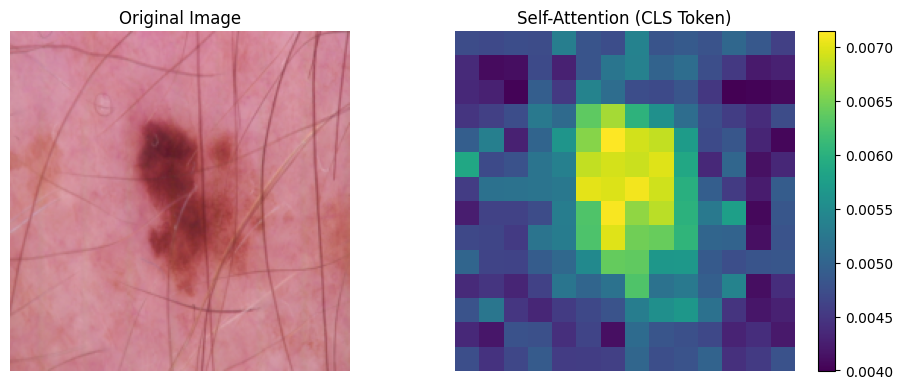

In [ ]:
attn_model = AttentionExtractor(model)
attn_model.eval()

# Pick a sample image
idx = random.randint(0, len(dataset)-1)
img = dataset[idx]
img_tensor = img.unsqueeze(0).to(device)

# Forward pass to collect attention maps
with torch.no_grad():
    attn_maps = attn_model(img_tensor)

# Use attention from the last block
attn = attn_maps[-1][0]  # [heads, tokens, tokens]
attn_cls = attn.mean(0)[0, 1:].reshape(14, 14).cpu().numpy()  # [196] → [14x14]

# Plot
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(attn_cls, cmap="viridis")
plt.title("Self-Attention (CLS Token)")
plt.colorbar()
plt.axis("off")

plt.tight_layout()
plt.show()


import torch
import random
import matplotlib.pyplot as plt

# Initialize the AttentionExtractor model
attn_model = AttentionExtractor(model)
attn_model.eval()

# Number of samples to visualize
num_samples = 4
indices = random.sample(range(len(dataset)), num_samples)

# Create a grid of plots: 2 columns (Original, Attention) and `num_samples` rows
plt.figure(figsize=(10, num_samples * 3))

# Loop over the selected sample indices to visualize the attention maps
for i, idx in enumerate(indices):
    # Get the selected image from the dataset
    img = dataset[idx]
    img_tensor = img.unsqueeze(0).to(device)  # Add batch dimension and move to the correct device

    # Forward pass to get attention maps from the model
    with torch.no_grad():
        attn_maps = attn_model(img_tensor)

    # Extract attention from the last block and average across all attention heads
    attn = attn_maps[-1][0]  # shape: [heads, tokens, tokens]
    attn_cls = attn.mean(0)[0, 1:].reshape(14, 14).cpu().numpy()  # Convert to a 14x14 grid

    # Plot the original image
    plt.subplot(num_samples, 2, 2 * i + 1)
    img_vis = img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5  # Unnormalize the image
    plt.imshow(img_vis)
    plt.title(f"Original Image #{i+1}")
    plt.axis("off")

    # Plot the attention heatmap
    plt.subplot(num_samples, 2, 2 * i + 2)
    plt.imshow(attn_cls, cmap="viridis")  # Use 'viridis' colormap for the attention heatmap
    plt.title("Self-Attention (CLS Token)")
    plt.colorbar()  # Add a color bar to the heatmap
    plt.axis("off")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


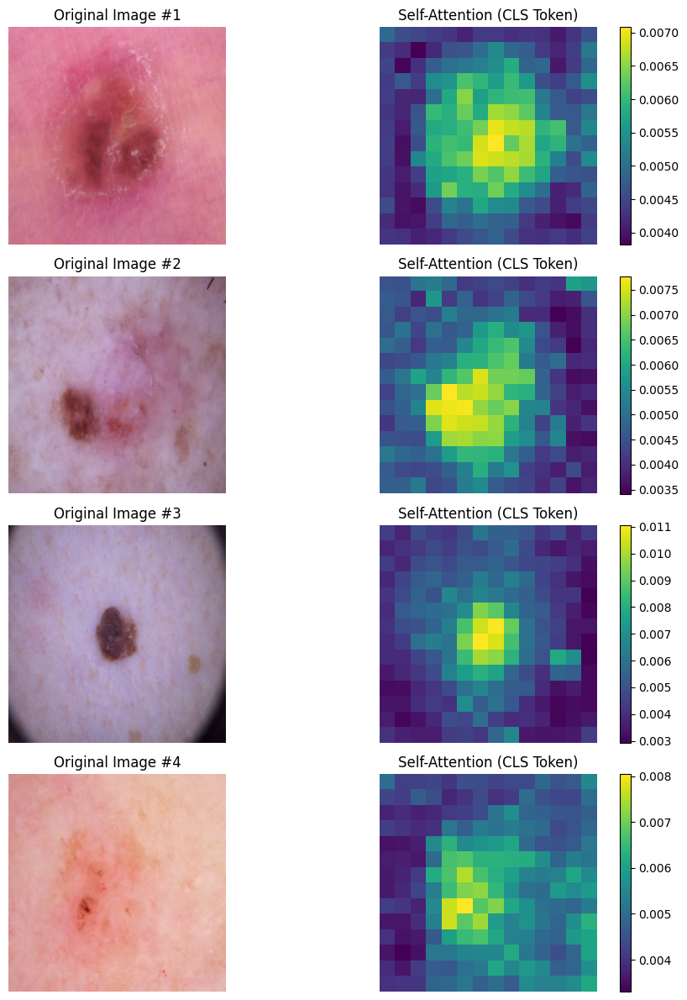

In [ ]:
import torch
import random
import matplotlib.pyplot as plt

attn_model = AttentionExtractor(model)
attn_model.eval()

# Number of samples to visualize
num_samples = 4
indices = random.sample(range(len(dataset)), num_samples)

# Create a grid of plots: 2 columns (Original, Attention) and `num_samples` rows
plt.figure(figsize=(10, num_samples * 3))

for i, idx in enumerate(indices):
    img = dataset[idx]
    img_tensor = img.unsqueeze(0).to(device)

    # Forward pass to get attention maps
    with torch.no_grad():
        attn_maps = attn_model(img_tensor)

    # Extract attention from the last block and average across heads
    attn = attn_maps[-1][0]  # shape: [heads, tokens, tokens]
    attn_cls = attn.mean(0)[0, 1:].reshape(14, 14).cpu().numpy()

    # Plot original image
    plt.subplot(num_samples, 2, 2 * i + 1)
    img_vis = img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5
    plt.imshow(img_vis)
    plt.title(f"Original Image #{i+1}")
    plt.axis("off")

    # Plot attention heatmap
    plt.subplot(num_samples, 2, 2 * i + 2)
    plt.imshow(attn_cls, cmap="viridis")
    plt.title("Self-Attention (CLS Token)")
    plt.colorbar()
    plt.axis("off")

plt.tight_layout()
plt.show()


<ipython-input-18-a068076d30a4>:6: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pca_features[:, 0], pca_features[:, 1], alpha=0.6, cmap='viridis')


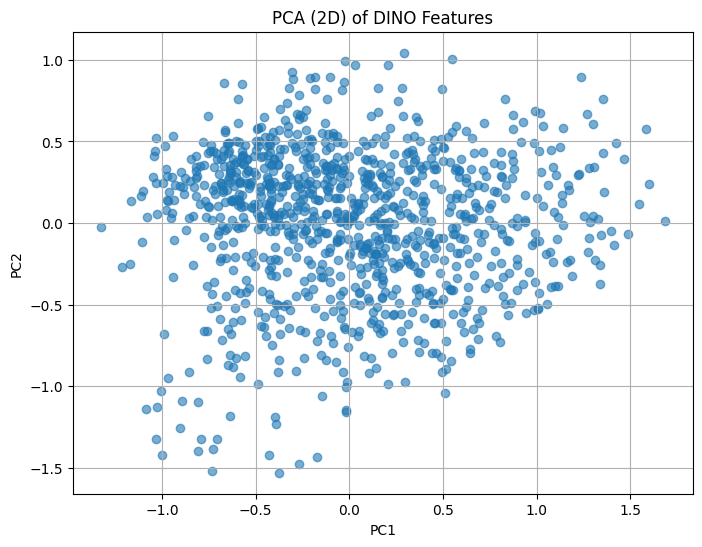

In [ ]:
pca = PCA(n_components=3)
pca_features = pca.fit_transform(features)

# Plot 2D PCA
plt.figure(figsize=(8, 6))
plt.scatter(pca_features[:, 0], pca_features[:, 1], alpha=0.6, cmap='viridis')
plt.title("PCA (2D) of DINO Features")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.show()


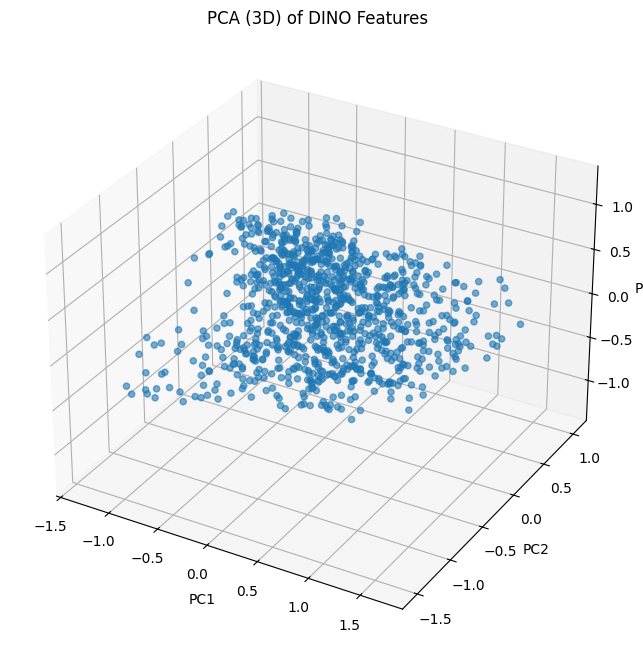

In [ ]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_features[:, 0], pca_features[:, 1], pca_features[:, 2], alpha=0.6)
ax.set_title("PCA (3D) of DINO Features")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.show()


<ipython-input-20-7f39de012f69>:6: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(tsne_features[:, 0], tsne_features[:, 1], alpha=0.6, cmap='plasma')


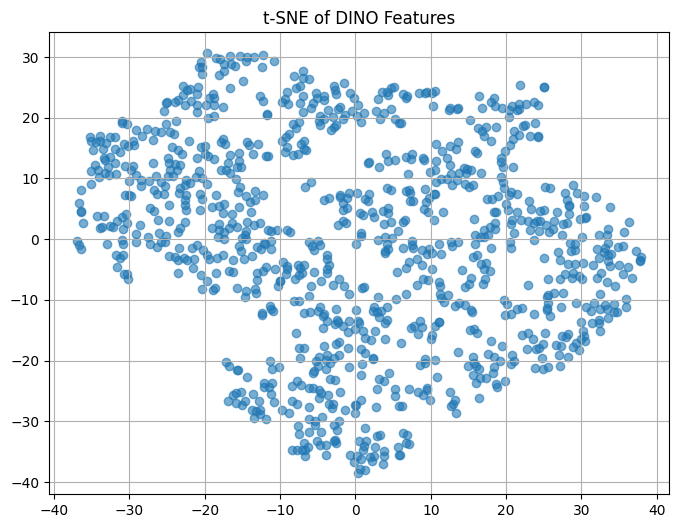

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, random_state=42, init='pca')
features = np.array(features)  # Convert list of feature vectors to NumPy array
tsne_features = tsne.fit_transform(features)

plt.figure(figsize=(8, 6))
plt.scatter(tsne_features[:, 0], tsne_features[:, 1], alpha=0.6, cmap='plasma')
plt.title("t-SNE of DINO Features")
plt.grid(True)
plt.show()


Point 3

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the path to your dataset
dataset_path = '/content/drive/MyDrive/HAM10000_dino_dataset'  # Adjust if needed

import pandas as pd
import os

# Load metadata
metadata_path = os.path.join(dataset_path, 'HAM10000_metadata.csv')
df = pd.read_csv(metadata_path)
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


### Summary:

This code preprocesses the HAM10000 skin lesion dataset, performing the following tasks:

* Loads metadata and associates image paths.
* Encodes the diagnostic labels.
* Splits data into training and validation sets (80/20 split).
* Defines image transformations (resizing, augmentation for training).
* Creates a custom dataset class to load images and labels.
* Sets up DataLoader instances for efficient batch processing during training and validation.


In [ ]:

# STEP 2: Dataset Preprocessing and DataLoader Setup

import os
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch

# Load the metadata
dataset_path = '/content/drive/MyDrive/HAM10000_dino_dataset'
df = pd.read_csv(os.path.join(dataset_path, 'HAM10000_metadata.csv'))

# Add path to image file (images are in image1/ and image2/)
df['image_path'] = df['image_id'].apply(lambda x:
    os.path.join(dataset_path, 'ham10000_images_part_1', x + '.jpg')
    if os.path.exists(os.path.join(dataset_path, 'ham10000_images_part_1', x + '.jpg'))
    else os.path.join(dataset_path, 'ham10000_images_part_2', x + '.jpg'))

# Encode labels
le = LabelEncoder()
df['label_encoded'] = le.fit_transform(df['dx'])

# Train-validation split
train_df, val_df = train_test_split(df, test_size=0.2, stratify=df['label_encoded'], random_state=42)

# Image transforms (DINO uses 224x224 ViT)
img_size = 224
train_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])
val_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# Custom dataset
class HAM10000Dataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row['image_path']).convert('RGB')
        if self.transform:
            image = self.transform(image)
        label = row['label_encoded']
        return image, label

# Create datasets and loaders
train_dataset = HAM10000Dataset(train_df, transform=train_transform)
val_dataset = HAM10000Dataset(val_df, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True, num_workers=4,pin_memory=True,prefetch_factor=2,persistent_workers=True)
val_loader = DataLoader(val_dataset, batch_size=512, shuffle=False, num_workers=4,pin_memory=True,prefetch_factor=2,persistent_workers=True)

### Summary:

This code loads a pretrained DINO Vision Transformer (ViT) model and modifies its head for skin lesion classification:

* Loads the ViT model (`vit_small_patch16_224.dino`) with no classification head.
* Adds a new classification head tailored for the HAM10000 dataset (7 classes).
* Freezes the backbone layers (no gradient updates during training).
* Combines the ViT backbone with the new classification head into a custom model class for forward pass.


In [ ]:

# STEP 3: Load Pretrained DINO Model and Modify Head

!pip install timm

import timm
import torch.nn as nn
import torch

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Load pretrained DINO backbone
# For example, vit_small_patch16_224.dino
model = timm.create_model('vit_small_patch16_224.dino', pretrained=True, num_classes=0)
print("Backbone loaded:", model)
model.reset_classifier(0)  # Ensure there's no head

# Add classification head (7 classes for HAM10000)
n_classes = df['label_encoded'].nunique()
head = nn.Sequential(
    nn.Linear(model.num_features, 512),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(512, n_classes)
)

# Combine model and head
class HAMModel(nn.Module):
    def __init__(self, backbone, head):
        super().__init__()
        self.backbone = backbone
        self.head = head

    def forward(self, x):
        # x = self.backbone(x)
        with torch.no_grad():  # Ensure backbone doesn't compute gradients
          x = self.backbone(x)
        x = self.head(x)
        return x

model = HAMModel(model, head).to(device)
for param in model.backbone.parameters():
    param.requires_grad = False


Using device: cpu
Backbone loaded: VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=384, out_features=1152, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inpla

### Summary:

This code implements the training loop with accuracy and loss tracking for the HAM10000 skin lesion classification:

* Uses mixed precision training with `GradScaler` and `autocast` for efficient GPU memory usage.
* Trains the model over 20 epochs, calculating loss and accuracy for both training and validation datasets.
* Tracks and prints training/validation loss and accuracy for each epoch.
* Plots the accuracy and loss curves for both training and validation sets over the epochs at the end.


GPU Memory: 0.00 GB


<ipython-input-12-c9df9306ae6f>:3: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/usr/local/lib/python3.11/dist-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [1/20] - Train Loss: 1.1821, Train Acc: 0.6464 - Val Loss: 0.9144, Val Acc: 0.6915


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [2/20] - Train Loss: 0.9250, Train Acc: 0.6918 - Val Loss: 0.8266, Val Acc: 0.7079


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [3/20] - Train Loss: 0.8375, Train Acc: 0.7094 - Val Loss: 0.7670, Val Acc: 0.7199


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [4/20] - Train Loss: 0.7761, Train Acc: 0.7257 - Val Loss: 0.7177, Val Acc: 0.7429


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [5/20] - Train Loss: 0.7311, Train Acc: 0.7374 - Val Loss: 0.6902, Val Acc: 0.7514


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [6/20] - Train Loss: 0.6986, Train Acc: 0.7504 - Val Loss: 0.6660, Val Acc: 0.7594


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [7/20] - Train Loss: 0.6762, Train Acc: 0.7579 - Val Loss: 0.6536, Val Acc: 0.7668


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [8/20] - Train Loss: 0.6555, Train Acc: 0.7670 - Val Loss: 0.6396, Val Acc: 0.7693


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [9/20] - Train Loss: 0.6310, Train Acc: 0.7713 - Val Loss: 0.6217, Val Acc: 0.7723


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [10/20] - Train Loss: 0.6146, Train Acc: 0.7781 - Val Loss: 0.6129, Val Acc: 0.7753


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [11/20] - Train Loss: 0.6087, Train Acc: 0.7766 - Val Loss: 0.5994, Val Acc: 0.7818


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [12/20] - Train Loss: 0.5906, Train Acc: 0.7871 - Val Loss: 0.5916, Val Acc: 0.7813


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [13/20] - Train Loss: 0.5729, Train Acc: 0.7949 - Val Loss: 0.5872, Val Acc: 0.7848


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [14/20] - Train Loss: 0.5637, Train Acc: 0.7981 - Val Loss: 0.5786, Val Acc: 0.7883


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [15/20] - Train Loss: 0.5566, Train Acc: 0.8005 - Val Loss: 0.5722, Val Acc: 0.7933


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [16/20] - Train Loss: 0.5439, Train Acc: 0.8029 - Val Loss: 0.5666, Val Acc: 0.7933


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [17/20] - Train Loss: 0.5345, Train Acc: 0.8029 - Val Loss: 0.5604, Val Acc: 0.7958


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [18/20] - Train Loss: 0.5260, Train Acc: 0.8110 - Val Loss: 0.5547, Val Acc: 0.7963


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [19/20] - Train Loss: 0.5145, Train Acc: 0.8176 - Val Loss: 0.5552, Val Acc: 0.7983


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch [20/20] - Train Loss: 0.5135, Train Acc: 0.8178 - Val Loss: 0.5529, Val Acc: 0.8018


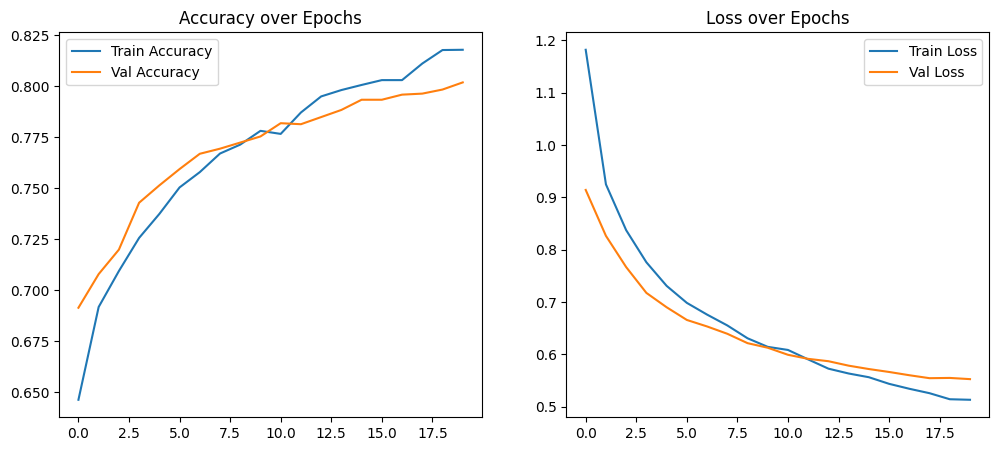

In [ ]:

# STEP 4: Training Loop with Accuracy, Loss Tracking
from torch.cuda.amp import autocast, GradScaler
scaler = GradScaler()

import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
import numpy as np
from tqdm.notebook import tqdm
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
num_epochs = 20
# Add this at different points in your code
print(f"GPU Memory: {torch.cuda.memory_allocated() / 1e9:.2f} GB")
train_acc_list, val_acc_list = [], []
train_loss_list, val_loss_list = [], []

for epoch in range(num_epochs):
    # Training
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_loss = running_loss / total
    train_acc = correct / total
    train_loss_list.append(train_loss)
    train_acc_list.append(train_acc)

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0.0, 0, 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * images.size(0)
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    val_loss /= val_total
    val_acc = val_correct / val_total
    val_loss_list.append(val_loss)
    val_acc_list.append(val_acc)

    print(f"Epoch [{epoch+1}/{num_epochs}] - "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} - "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

# Plot Accuracy & Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_acc_list, label='Train Accuracy')
plt.plot(val_acc_list, label='Val Accuracy')
plt.legend()
plt.title('Accuracy over Epochs')

plt.subplot(1, 2, 2)
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Val Loss')
plt.legend()
plt.title('Loss over Epochs')
plt.show()

### Summary:

This code generates and visualizes the confusion matrix and per-class accuracy for the HAM10000 model:

* Displays a heatmap of the confusion matrix to show predicted vs true labels.
* Computes per-class accuracy by dividing the diagonal of the confusion matrix by the row sums.
* Plots a bar chart showing per-class accuracy.
* Optionally prints the accuracy for each class in percentage form.


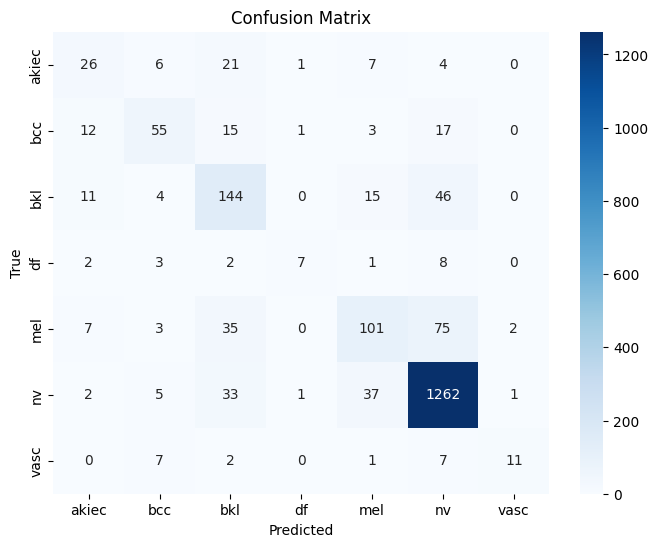

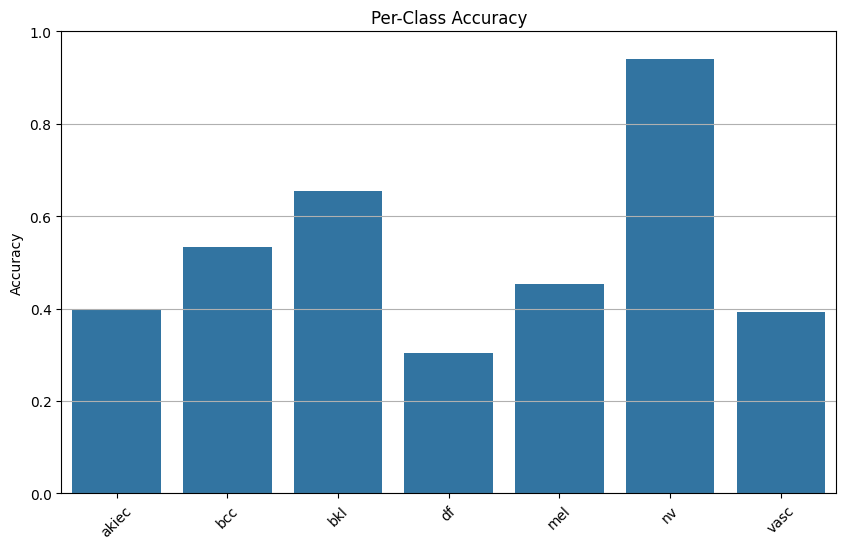

akiec: 40.00%
bcc: 53.40%
bkl: 65.45%
df: 30.43%
mel: 45.29%
nv: 94.11%
vasc: 39.29%


In [ ]:

# STEP 5 & 6: Confusion Matrix and Per-Class Accuracy

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns

# Convert label indices back to original class names
class_names = le.classes_

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_names, yticklabels=class_names, cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Per-class accuracy
per_class_acc = cm.diagonal() / cm.sum(axis=1)

# Bar chart for per-class accuracy
plt.figure(figsize=(10, 6))
sns.barplot(x=class_names, y=per_class_acc)
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.title("Per-Class Accuracy")
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

# Optional: Print class-wise accuracy
for i, acc in enumerate(per_class_acc):
    print(f"{class_names[i]}: {acc:.2%}")

### Summary:

This code dynamically adds an `extract_features` method to the model:

* The method performs a forward pass through the DINO backbone without updating gradients (`torch.no_grad()`), extracting features from the input `x`.
* The method is then attached to the model using `types.MethodType`, allowing feature extraction from the trained model.


In [ ]:
import types

def extract_features(self, x):
    # Forward pass through DINO backbone only
    with torch.no_grad():
        feats = self.backbone(x)  # shape: (B, num_features)
    return feats

# Attach extract_features method dynamically to model
model.extract_features = types.MethodType(extract_features, model)


### Summary:

This code extracts features from the trained model and visualizes them in 2D using PCA and t-SNE:

* The `extract_features` function gathers features from the model for each batch in the validation set.
* `visualize_feature_space` plots the feature space using either PCA or t-SNE, based on the selected method, and color-codes the points according to their class labels.
* Both PCA and t-SNE visualizations are generated to help explore the feature space.


Extracting features: 100%|██████████| 4/4 [01:55<00:00, 28.97s/it]


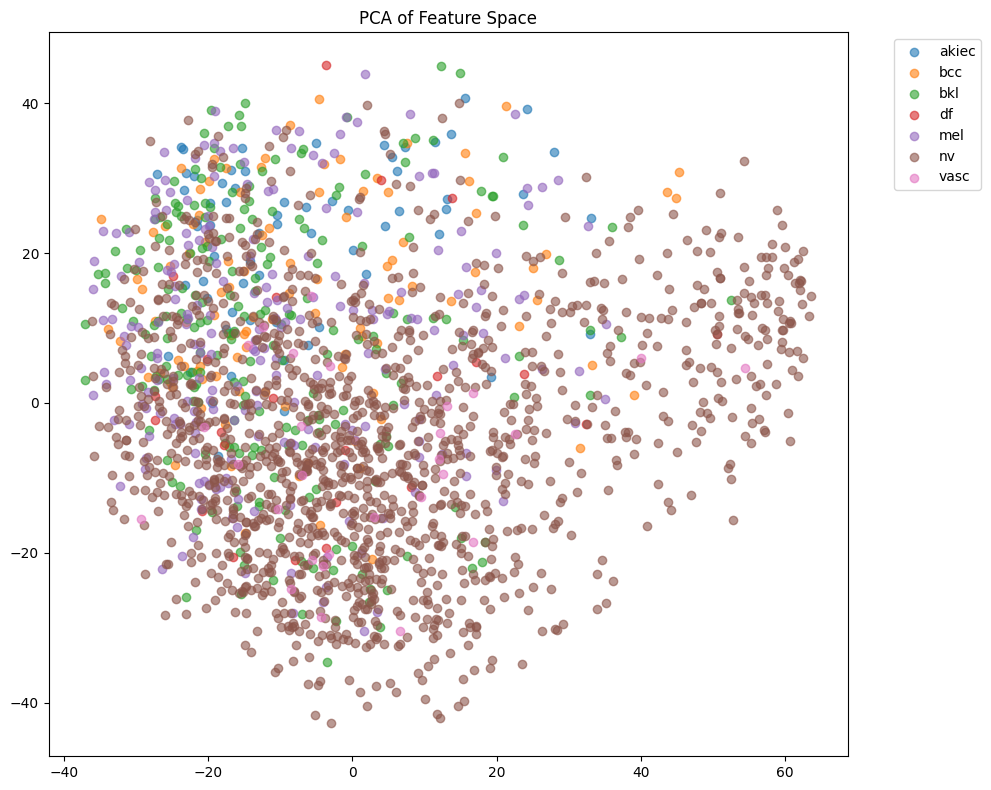

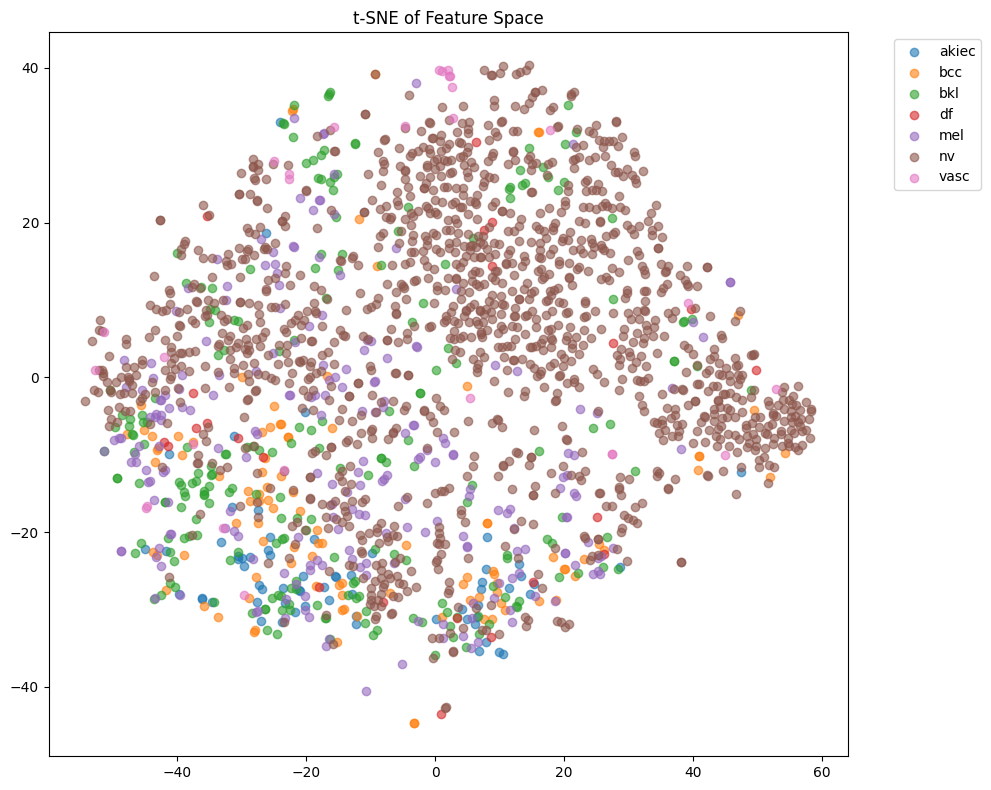

In [ ]:
# Feature extractor utility
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

def extract_features(model, data_loader, device):
    model.eval()
    features, labels = [], []

    with torch.no_grad():
        for images, batch_labels in tqdm(data_loader, desc="Extracting features"):
            images = images.to(device)
            feats = model.extract_features(images)
            features.append(feats.cpu().numpy())
            labels.append(batch_labels.numpy())

    return np.vstack(features), np.concatenate(labels)

def visualize_feature_space(features, labels, class_names, method='tsne'):
    plt.figure(figsize=(10, 8))

    if method == 'pca':
        reducer = PCA(n_components=2)
        reduced = reducer.fit_transform(features)
        title = 'PCA of Feature Space'
    else:
        reducer = TSNE(n_components=2, random_state=42, perplexity=30)
        reduced = reducer.fit_transform(features)
        title = 't-SNE of Feature Space'

    for i, class_name in enumerate(class_names):
        mask = labels == i
        plt.scatter(reduced[mask, 0], reduced[mask, 1], label=class_name, alpha=0.6)

    plt.title(title)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Run PCA & t-SNE
features, feature_labels = extract_features(model, val_loader, device)
visualize_feature_space(features, feature_labels, class_names=le.classes_, method='pca')
visualize_feature_space(features, feature_labels, class_names=le.classes_, method='tsne')


### Visualizing CLS Token Attention in Vision Transformers

This code patches the attention layers in a Vision Transformer (ViT) model to extract and visualize the class (CLS) token attention maps. It shows where the model focuses in an image during classification by overlaying the attention heatmap on the input image using Matplotlib.


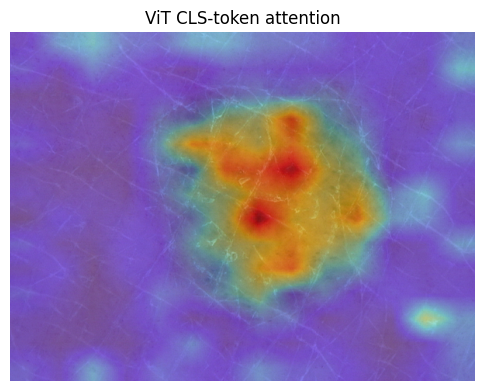

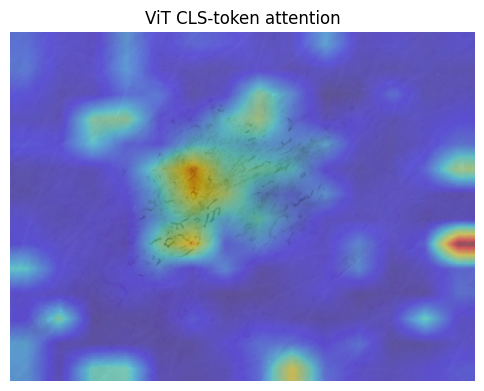

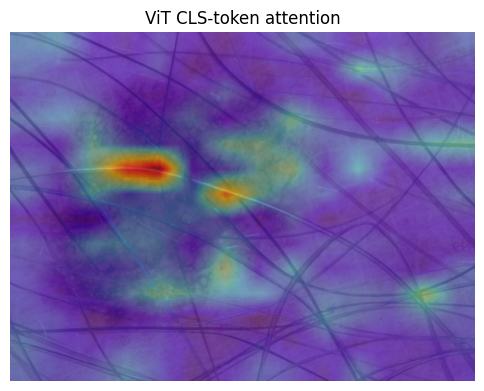

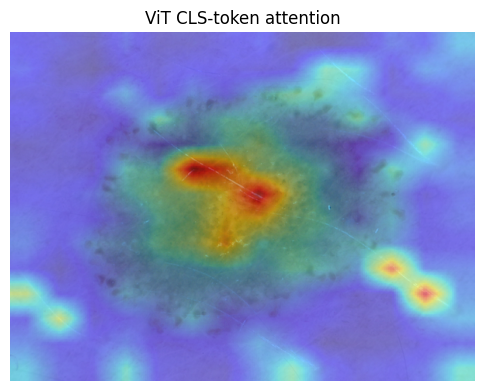

In [ ]:
import torch
from collections import OrderedDict
import types, torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt

for blk in model.backbone.blocks:
    blk.attn._forward_hooks      = OrderedDict()
    blk.attn._forward_pre_hooks  = OrderedDict()
    blk.attn._backward_hooks     = OrderedDict()

def _patch_timm_attention(attn_mod):
    if hasattr(attn_mod, "is_patched"):                 # already good
        return

    qkv, proj           = attn_mod.qkv, attn_mod.proj
    num_heads, scale    = attn_mod.num_heads, attn_mod.scale
    attn_drop, proj_drop = attn_mod.attn_drop, attn_mod.proj_drop
    drop_path           = getattr(attn_mod, "drop_path", None)

    def _forward(self, x):
        B, N, C = x.shape
        qkv_out = qkv(x).reshape(B, N, 3, num_heads, C // num_heads)\
                         .permute(2, 0, 3, 1, 4)
        q, k, v = qkv_out.unbind(0)
        attn    = (q @ k.transpose(-2, -1)) * scale
        attn    = attn.softmax(dim=-1)
        self.last_attn = attn                       # 🔑 save the weights
        attn    = attn_drop(attn)

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = proj_drop(proj(x))
        return drop_path(x) if drop_path is not None else x

    attn_mod.forward   = types.MethodType(_forward, attn_mod)
    attn_mod.is_patched = True

for blk in model.backbone.blocks:
    _patch_timm_attention(blk.attn)

@torch.no_grad()
def _cls_attention_map(model, img_tensor, upsample=16):
    _ = model.backbone(img_tensor)
    attn = model.backbone.blocks[-1].attn.last_attn        # (1,H,T,T)
    attn = attn.mean(dim=1)[0]                             # (T,T)
    cls_attn = attn[0, 1:]
    grid = int(cls_attn.numel() ** 0.5)
    cls_attn = cls_attn.reshape(1, 1, grid, grid)
    cls_attn = torch.nn.functional.interpolate(
        cls_attn, scale_factor=upsample, mode='bilinear', align_corners=False
    )[0, 0]
    return (cls_attn / cls_attn.max()).cpu()

def visualize_attention(img_path, model,
                        transform=val_transform,
                        device=device,
                        cmap='jet', alpha=0.45):
    model.eval()
    img = Image.open(img_path).convert('RGB')
    t_img = transform(img).unsqueeze(0).to(device)
    mask = _cls_attention_map(model, t_img)                # (224,224)

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.imshow(mask, cmap=cmap, alpha=alpha,
               extent=(0, img.size[0], img.size[1], 0))
    plt.axis('off')
    plt.title('ViT CLS‑token attention')
    plt.show()

visualize_attention(
    '/content/drive/MyDrive/HAM10000_dino_dataset/ham10000_images_part_1/ISIC_0024327.jpg',
    model
)
visualize_attention(
    '/content/drive/MyDrive/HAM10000_dino_dataset/ham10000_images_part_1/ISIC_0024324.jpg',
    model
)
visualize_attention(
    '/content/drive/MyDrive/HAM10000_dino_dataset/ham10000_images_part_1/ISIC_0024320.jpg',
    model
)
visualize_attention(
    '/content/drive/MyDrive/HAM10000_dino_dataset/ham10000_images_part_1/ISIC_0024317.jpg',
    model
)


#Assigment no 2

### Summary:

This code sets up the environment and imports necessary libraries for skin lesion classification:

* Mounts Google Drive to access data.
* Sets random seeds for reproducibility.
* Imports essential libraries like PyTorch, scikit-learn, OpenCV, and others for data preprocessing, model training, evaluation, and visualization.
* Ensures deterministic behavior by configuring PyTorch settings.


In [ ]:
# Skin Lesion Classification Using DINO Features + Attention Visualization
# Setup and imports

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from PIL import Image
from tqdm import tqdm
import torchvision
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import cv2
from google.colab import drive
import gc

# Mount Google Drive
drive.mount('/content/drive')

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


Mounted at /content/drive


### Summary:

This code sets up the device (GPU or CPU) for training and verifies paths for the dataset:

* Checks the existence of metadata and image folders.
* Loads and explores the metadata, displaying the dataset size and class distribution.
* Maps class names to integer indices and adds a new column (`class_idx`) to the metadata for label encoding.


In [ ]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Data paths
BASE_PATH = '/content/drive/MyDrive/HAM10000_dino_dataset'
METADATA_PATH = os.path.join(BASE_PATH, 'HAM10000_metadata.csv')
IMAGES_PATH_1 = os.path.join(BASE_PATH, 'ham10000_images_part_1')
IMAGES_PATH_2 = os.path.join(BASE_PATH, 'ham10000_images_part_2')

# Check if paths exist
print(f"Metadata exists: {os.path.exists(METADATA_PATH)}")
print(f"Images part 1 exists: {os.path.exists(IMAGES_PATH_1)}")
print(f"Images part 2 exists: {os.path.exists(IMAGES_PATH_2)}")

# Load and explore the metadata
metadata = pd.read_csv(METADATA_PATH)
print(f"Dataset size: {len(metadata)}")
print("\nClass distribution:")
print(metadata['dx'].value_counts())

# Map classes to integers
class_to_idx = {cls: idx for idx, cls in enumerate(metadata['dx'].unique())}
idx_to_class = {idx: cls for cls, idx in class_to_idx.items()}
print("\nClass mapping:")
for cls, idx in class_to_idx.items():
    print(f"{cls}: {idx}")

# Add class index to metadata
metadata['class_idx'] = metadata['dx'].map(class_to_idx)


Using device: cuda
Metadata exists: True
Images part 1 exists: True
Images part 2 exists: True
Dataset size: 10015

Class distribution:
dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64

Class mapping:
bkl: 0
nv: 1
df: 2
mel: 3
vasc: 4
bcc: 5
akiec: 6


### Summary:

This code creates a list of valid image paths from the dataset:

* Loops through image IDs and checks if each image exists in one of two folders.
* Adds the image paths to the metadata, mapping `image_id` to the corresponding file path.
* Drops any rows where the image path is missing and prints the final dataset size after removing these entries.


In [ ]:
# Create a list of all image paths
all_images = []
for img_id in metadata['image_id']:
    img_name = f"{img_id}.jpg"
    path_1 = os.path.join(IMAGES_PATH_1, img_name)
    path_2 = os.path.join(IMAGES_PATH_2, img_name)

    if os.path.exists(path_1):
        all_images.append(path_1)
    elif os.path.exists(path_2):
        all_images.append(path_2)
    else:
        print(f"Warning: Image {img_name} not found")

print(f"\nTotal images found: {len(all_images)}")
print(f"Missing images: {len(metadata) - len(all_images)}")

# Create a mapping from image_id to file path
image_paths = {}
for img_path in all_images:
    img_id = os.path.basename(img_path).split('.')[0]
    image_paths[img_id] = img_path

# Add image paths to metadata
metadata['image_path'] = metadata['image_id'].map(image_paths)

# Drop rows with missing images
metadata = metadata.dropna(subset=['image_path'])
print(f"Final dataset size after removing missing images: {len(metadata)}")



Total images found: 10015
Missing images: 0
Final dataset size after removing missing images: 10015


### Summary:

This code splits the dataset into training and validation sets:

* Divides the metadata into training (80%) and validation (20%) sets using stratified sampling to maintain class distribution.
* Defines transformations to preprocess the images for DINO feature extraction (resize, normalize, and convert to tensor).


In [ ]:
# Split data into train, validation
train_df, valid_df = train_test_split(
    metadata,
    test_size=0.2,
    stratify=metadata['class_idx'],
    random_state=42
)

print(f"Training set size: {len(train_df)}")
print(f"Validation set size: {len(valid_df)}")

# Define transformations for DINO feature extraction
dino_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Training set size: 8012
Validation set size: 2003


### Summary:

This code defines custom classes and functions for skin lesion image classification using DINO features:

* **SkinLesionDataset**: Custom dataset class to load images and their corresponding labels, with an option to return image IDs.
* **DinoFeatureExtractor**: Class to load the pre-trained DINO model, extract features from images, and retrieve attention maps.
* **extract\_and\_save\_features**: Function to extract DINO features for all images in the dataset, save them to disk, and return the extracted features, image IDs, and labels.

It uses DINO's Vision Transformer model to extract features for each image in the dataset and stores them in `.npz` files.


In [ ]:
# Custom dataset for skin lesion images
class SkinLesionDataset(Dataset):
    def __init__(self, dataframe, transform=None, return_image_id=False):
        self.dataframe = dataframe
        self.transform = transform
        self.return_image_id = return_image_id

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        label = self.dataframe.iloc[idx]['class_idx']
        image_id = self.dataframe.iloc[idx]['image_id']

        # Load image
        image = Image.open(img_path).convert('RGB')

        # Apply transformations
        if self.transform:
            image = self.transform(image)

        if self.return_image_id:
            return image, label, image_id
        else:
            return image, label

# DINO ViT feature extractor
class DinoFeatureExtractor:
    def __init__(self, model_name='dino_vits16'):
        # Load the pre-trained DINO model
        self.model = torch.hub.load('facebookresearch/dino:main', model_name)
        self.model.eval()
        self.model.to(device)

        # Get feature dimension
        self.feature_dim = self.model.embed_dim
        print(f"DINO feature dimension: {self.feature_dim}")

    def extract_features(self, images):
        with torch.no_grad():
            # Get features from DINO model
            features = self.model(images)
        return features

    def get_attention_maps(self, images):
        # Register hook to get attention weights
        attention_maps = []

        def hook_fn(module, input, output):
            attention_maps.append(output[1])  # The second output is the attention map

        # Register hook for the last attention layer
        handle = self.model.blocks[-1].attn.register_forward_hook(hook_fn)

        # Forward pass
        with torch.no_grad():
            _ = self.model(images)

        # Remove hook
        handle.remove()

        # Process attention maps
        attn = attention_maps[0]  # Shape: [batch_size, num_heads, num_patches, num_patches]
        attn = attn.mean(dim=1)   # Average over heads

        return attn

# Extract DINO features for all images
def extract_and_save_features(dataframe, batch_size=32, feature_dir='dino_features'):
    """Extract DINO features for all images in the dataframe and save them to disk"""
    dataset = SkinLesionDataset(dataframe, transform=dino_transform, return_image_id=True)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    # Initialize feature extractor
    feature_extractor = DinoFeatureExtractor()

    # Create directory to save features
    os.makedirs(feature_dir, exist_ok=True)

    features_dict = {}
    image_ids = []
    labels = []

    with torch.no_grad():
        for batch_images, batch_labels, batch_image_ids in tqdm(dataloader, desc="Extracting features"):
            batch_images = batch_images.to(device)

            # Extract features
            batch_features = feature_extractor.extract_features(batch_images)

            # Store features
            for i, image_id in enumerate(batch_image_ids):
                features_dict[image_id] = batch_features[i].cpu().numpy()
                image_ids.append(image_id)
                labels.append(batch_labels[i].item())

    # Save features to disk
    np.savez(
        os.path.join(feature_dir, 'dino_features.npz'),
        features=np.array([features_dict[img_id] for img_id in image_ids]),
        image_ids=np.array(image_ids),
        labels=np.array(labels)
    )

    print(f"Features saved to {os.path.join(feature_dir, 'dino_features.npz')}")
    return features_dict, image_ids, labels


### Summary:

This code manages the feature extraction process and prepares the datasets for training:

* **Feature Directory**: Creates a directory to store DINO features and checks if the features are already extracted. If not, it extracts and saves them using the `extract_and_save_features` function.
* **FeatureDataset**: A custom dataset class that loads pre-extracted features from a dictionary and pairs them with their corresponding labels.
* **Data Loaders**: Creates data loaders for both the training and validation datasets using the pre-extracted features for efficient training.

It also handles memory management by clearing up GPU memory and garbage collection after feature extraction.


In [ ]:
# Create a feature directory
FEATURE_DIR = os.path.join(BASE_PATH, 'dino_features')
os.makedirs(FEATURE_DIR, exist_ok=True)

# Extract features if they don't exist
FEATURE_FILE = os.path.join(FEATURE_DIR, 'dino_features.npz')
if not os.path.exists(FEATURE_FILE):
    features_dict, image_ids, labels = extract_and_save_features(metadata, feature_dir=FEATURE_DIR)
else:
    # Load pre-extracted features
    data = np.load(FEATURE_FILE, allow_pickle=True)
    features = data['features']
    image_ids = data['image_ids']
    labels = data['labels']

    features_dict = {}
    for i, img_id in enumerate(image_ids):
        features_dict[img_id] = features[i]

    print(f"Loaded {len(features_dict)} pre-extracted features")

# Free up memory
gc.collect()
if device.type == 'cuda':
    torch.cuda.empty_cache()

# Define custom dataset for pre-extracted features
class FeatureDataset(Dataset):
    def __init__(self, dataframe, features_dict):
        self.dataframe = dataframe
        self.features_dict = features_dict

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        image_id = self.dataframe.iloc[idx]['image_id']
        label = self.dataframe.iloc[idx]['class_idx']

        # Get pre-extracted features
        features = torch.tensor(self.features_dict[image_id], dtype=torch.float32)

        return features, label, image_id

# Create train and validation datasets
train_dataset = FeatureDataset(train_df, features_dict)
valid_dataset = FeatureDataset(valid_df, features_dict)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2,pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False, num_workers=2,pin_memory=True)


Loaded 10015 pre-extracted features


This code trains a classifier (either a linear model or MLP) on pre-extracted features from the DINO model for skin lesion classification. It tracks training and validation accuracy, saves the best model based on validation performance, and uses a learning rate scheduler.


In [ ]:
# Define classifier head models
class LinearClassifier(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(LinearClassifier, self).__init__()
        self.linear = nn.Linear(input_dim, num_classes)

    def forward(self, x):
        return self.linear(x)

class MLPClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_classes, dropout_rate=0.5):
        super(MLPClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Training function
def train_model(model, train_loader, valid_loader, criterion, optimizer, num_epochs=10, scheduler=None):
    model.to(device)

    # For tracking metrics
    history = {
        'train_loss': [],
        'train_acc': [],
        'valid_loss': [],
        'valid_acc': [],
        'best_valid_acc': 0.0,
    }

    # Training loop
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_running_loss = 0.0
        train_correct = 0
        train_total = 0

        for features, labels, _ in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]"):
            features = features.to(device)
            labels = labels.to(device)

            # Zero gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(features)

            # Calculate loss
            loss = criterion(outputs, labels)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            # Track metrics
            train_running_loss += loss.item() * features.size(0)
            _, predicted = torch.max(outputs, 1)
            train_correct += (predicted == labels).sum().item()
            train_total += labels.size(0)

        # Update learning rate
        if scheduler:
            scheduler.step()

        # Calculate epoch metrics
        train_loss = train_running_loss / train_total
        train_acc = train_correct / train_total

        # Validation phase
        model.eval()
        valid_running_loss = 0.0
        valid_correct = 0
        valid_total = 0

        with torch.no_grad():
            for features, labels, _ in tqdm(valid_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Valid]"):
                features = features.to(device)
                labels = labels.to(device)

                # Forward pass
                outputs = model(features)

                # Calculate loss
                loss = criterion(outputs, labels)

                # Track metrics
                valid_running_loss += loss.item() * features.size(0)
                _, predicted = torch.max(outputs, 1)
                valid_correct += (predicted == labels).sum().item()
                valid_total += labels.size(0)

        # Calculate epoch metrics
        valid_loss = valid_running_loss / valid_total
        valid_acc = valid_correct / valid_total

        # Update history
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['valid_loss'].append(valid_loss)
        history['valid_acc'].append(valid_acc)

        # Save best model
        if valid_acc > history['best_valid_acc']:
            history['best_valid_acc'] = valid_acc
            torch.save(model.state_dict(), 'best_model.pt')

        # Print epoch results
        print(f"Epoch {epoch+1}/{num_epochs} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
              f"Valid Loss: {valid_loss:.4f}, Valid Acc: {valid_acc:.4f}")

    # Load best model
    model.load_state_dict(torch.load('best_model.pt'))

    return model, history


### Model Evaluation Summary

This code evaluates the performance of the trained model on a given dataset using various metrics. It computes:

* **Accuracy**: Overall classification accuracy.
* **F1 Score (weighted)**: Weighted F1 score for imbalanced classes.
* **Precision (weighted)**: Weighted precision score.
* **Recall (weighted)**: Weighted recall score.

Additionally, it calculates **per-class metrics** for precision, recall, and F1 score. The confusion matrix is also visualized using a heatmap to show true vs predicted class labels.

The output includes:

* The overall accuracy, F1 score, precision, and recall.
* Per-class performance metrics.
* A confusion matrix heatmap for visual inspection.


In [ ]:
# Evaluate model and compute metrics
def evaluate_model(model, dataloader):
    model.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for features, labels, _ in tqdm(dataloader, desc="Evaluating"):
            features = features.to(device)
            labels = labels.to(device)

            outputs = model(features)
            _, predicted = torch.max(outputs, 1)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate metrics
    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')

    # Per-class metrics
    per_class_precision = precision_score(all_labels, all_preds, average=None)
    per_class_recall = recall_score(all_labels, all_preds, average=None)
    per_class_f1 = f1_score(all_labels, all_preds, average=None)

    print(f"Accuracy: {accuracy:.4f}")
    print(f"F1 Score (weighted): {f1:.4f}")
    print(f"Precision (weighted): {precision:.4f}")
    print(f"Recall (weighted): {recall:.4f}")

    # Print per-class metrics
    print("\nPer-class metrics:")
    for cls_idx, cls_name in idx_to_class.items():
        print(f"Class {cls_name}: Precision: {per_class_precision[cls_idx]:.4f}, "
              f"Recall: {per_class_recall[cls_idx]:.4f}, "
              f"F1: {per_class_f1[cls_idx]:.4f}")

    # Plot confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=list(idx_to_class.values()),
                yticklabels=list(idx_to_class.values()))
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    return {
        'accuracy': accuracy,
        'f1': f1,
        'precision': precision,
        'recall': recall,
        'per_class_precision': per_class_precision,
        'per_class_recall': per_class_recall,
        'per_class_f1': per_class_f1,
        'confusion_matrix': cm
    }


### Summary of the Code:

This code contains two main functions:

1. **`plot_history(history)`**:

   * This function visualizes the training process by plotting:

     * **Training and validation loss** over epochs.
     * **Training and validation accuracy** over epochs.
   * It helps in tracking the model’s learning progress during training and validation.

2. **`visualize_attention(model_name, num_samples)`**:

   * This function visualizes the attention maps generated by the DINO model.
   * For a selected number of samples (default is 5):

     * It extracts and overlays attention maps on the original image.
     * The attention map highlights regions of the image that the model focuses on while making predictions.
   * It displays:

     * The original image.
     * The attention map (indicating model focus).
     * The superimposed image with the attention map overlay.

These functions are useful for understanding the model’s behavior and performance visually, both in terms of training progression and model attention.


In [ ]:
# Plot training history
def plot_history(history):
    plt.figure(figsize=(12, 5))

    # Plot training & validation loss
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['valid_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    # Plot training & validation accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train Accuracy')
    plt.plot(history['valid_acc'], label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Visualize attention maps
def visualize_attention(model_name='dino_vits16', num_samples=5):
    # Initialize DINO model
    dino_model = DinoFeatureExtractor(model_name)

    # Create dataset with original images
    dataset = SkinLesionDataset(valid_df.sample(num_samples), transform=dino_transform, return_image_id=True)

    # Create a figure to display attention maps
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

    # Process images one by one
    for i in range(num_samples):
        image, label, image_id = dataset[i]

        # Get the original image
        img_path = valid_df[valid_df['image_id'] == image_id]['image_path'].values[0]
        original_img = Image.open(img_path).convert('RGB')

        # Get class name
        class_name = idx_to_class[label.item()]

        # Get attention map
        img_tensor = image.unsqueeze(0).to(device)
        attention = dino_model.get_attention_maps(img_tensor)[0]  # Shape: [num_patches, num_patches]

        # Extract attention for the class token
        cls_attention = attention[0, 1:].reshape(14, 14).cpu().numpy()

        # Resize attention map to match the original image size
        cls_attention = (cls_attention - cls_attention.min()) / (cls_attention.max() - cls_attention.min())
        cls_attention_resized = cv2.resize(cls_attention, (original_img.width, original_img.height))

        # Convert to heatmap
        heatmap = cv2.applyColorMap(np.uint8(255 * cls_attention_resized), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

        # Overlay attention map on original image
        original_img_np = np.array(original_img)
        superimposed = cv2.addWeighted(original_img_np, 0.6, heatmap, 0.4, 0)

        # Plot
        axes[i, 0].imshow(original_img)
        axes[i, 0].set_title(f"Original - Class: {class_name}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(cls_attention_resized, cmap='jet')
        axes[i, 1].set_title("Attention Map")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(superimposed)
        axes[i, 2].set_title("Superimposed")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()


### Code Summary:

1. **`visualize_features_tsne(features_dict, labels_dict, perplexity=30)`**:

   * This function applies t-SNE (t-Distributed Stochastic Neighbor Embedding) to reduce the dimensionality of features from the DINO model into 2D.
   * It takes `features_dict` (DINO features) and `labels_dict` (class labels) as input.
   * It visualizes the features in 2D, with each class represented in a different color, allowing you to see the separation of different classes based on their feature representations.

2. **`train_and_evaluate()`**:

   * This function trains and evaluates two models:

     * **Linear Classifier** (commented-out in the code).
     * **MLP Classifier**: A Multi-Layer Perceptron classifier is trained on the extracted features from the DINO model.
   * The training process uses Adam optimizer and applies a learning rate scheduler that reduces the learning rate when validation loss plateaus.
   * After training, the model’s history (loss and accuracy) is plotted, and performance metrics (accuracy, F1 score, etc.) are evaluated using the validation data.

### Key Points:

* **t-SNE Visualization** helps in understanding the feature distribution in lower dimensions.
* **MLP Classifier** is trained with a learning rate scheduler for improved performance.


In [ ]:
def visualize_features_tsne(features_dict, labels_dict, perplexity=30):
    # Get features and labels
    features = []
    labels = []

    for img_id in features_dict:
        if img_id in labels_dict:  # Check if img_id exists in labels_dict
            features.append(features_dict[img_id])
            labels.append(labels_dict[img_id])
        else:
            print(f"Warning: Image ID {img_id} not found in labels_dict, skipping it.")

    features = np.array(features)
    labels = np.array(labels)

    # Dimensionality reduction using t-SNE
    print("Applying t-SNE...")
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    features_2d = tsne.fit_transform(features)

    # Plot
    plt.figure(figsize=(10, 8))
    for cls_idx, cls_name in idx_to_class.items():
        mask = labels == cls_idx
        plt.scatter(features_2d[mask, 0], features_2d[mask, 1], label=cls_name, alpha=0.7)

    plt.legend()
    plt.title('t-SNE Visualization of DINO Features')
    plt.show()

# Train and evaluate the models
def train_and_evaluate():
    # Initialize models
    input_dim = next(iter(train_loader))[0].shape[1]
    num_classes = len(class_to_idx)

    # 1. Linear classifier
    # linear_classifier = LinearClassifier(input_dim, num_classes)

    # 2. MLP classifier
    mlp_classifier = MLPClassifier(input_dim, 256, num_classes, dropout_rate=0.5)

    # Training parameters
    num_epochs = 100
    criterion = nn.CrossEntropyLoss()

    # Train Linear Classifier
    # print("\n\n=== Training Linear Classifier ===")
    # optimizer = optim.Adam(linear_classifier.parameters(), lr=0.001)
    # scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

    # linear_classifier, linear_history = train_model(
    #     linear_classifier,
    #     train_loader,
    #     valid_loader,
    #     criterion,
    #     optimizer,
    #     num_epochs=num_epochs,
    #     scheduler=scheduler
    # )

    # # Plot training history
    # plot_history(linear_history)

    # Evaluate Linear Classifier
    # print("\n=== Evaluating Linear Classifier ===")
    # linear_metrics = evaluate_model(linear_classifier, valid_loader)

    # Train MLP Classifier
    print("\n\n=== Training MLP Classifier ===")
    optimizer = optim.Adam(mlp_classifier.parameters(), lr=0.001, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)

    mlp_classifier, mlp_history = train_model(
        mlp_classifier,
        train_loader,
        valid_loader,
        criterion,
        optimizer,
        num_epochs=num_epochs,
        scheduler=None  # Scheduler is not compatible with this train_model function
    )

    # Plot training history
    plot_history(mlp_history)

    # Evaluate MLP Classifier
    print("\n=== Evaluating MLP Classifier ===")
    mlp_metrics = evaluate_model(mlp_classifier, valid_loader)

    return mlp_classifier, mlp_metrics


#Model training and loss, accuracy plotting



=== Training MLP Classifier ===


Epoch 1/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 137.28it/s]


Epoch 1/100 - Train Loss: 0.8583, Train Acc: 0.7132, Valid Loss: 0.6569, Valid Acc: 0.7584


Epoch 2/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 121.13it/s]


Epoch 2/100 - Train Loss: 0.6472, Train Acc: 0.7636, Valid Loss: 0.5811, Valid Acc: 0.7913


Epoch 3/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 136.34it/s]


Epoch 3/100 - Train Loss: 0.5809, Train Acc: 0.7887, Valid Loss: 0.5604, Valid Acc: 0.7978


Epoch 4/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 140.89it/s]


Epoch 4/100 - Train Loss: 0.5393, Train Acc: 0.8000, Valid Loss: 0.5251, Valid Acc: 0.8103


Epoch 5/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.19it/s]


Epoch 5/100 - Train Loss: 0.5035, Train Acc: 0.8150, Valid Loss: 0.5215, Valid Acc: 0.8128


Epoch 6/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.78it/s]


Epoch 6/100 - Train Loss: 0.4938, Train Acc: 0.8190, Valid Loss: 0.5025, Valid Acc: 0.8203


Epoch 7/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 128.08it/s]


Epoch 7/100 - Train Loss: 0.4685, Train Acc: 0.8299, Valid Loss: 0.4859, Valid Acc: 0.8183


Epoch 8/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.87it/s]


Epoch 8/100 - Train Loss: 0.4613, Train Acc: 0.8326, Valid Loss: 0.4768, Valid Acc: 0.8313


Epoch 9/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 146.38it/s]


Epoch 9/100 - Train Loss: 0.4356, Train Acc: 0.8405, Valid Loss: 0.4977, Valid Acc: 0.8248


Epoch 10/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 143.46it/s]


Epoch 10/100 - Train Loss: 0.4337, Train Acc: 0.8402, Valid Loss: 0.4636, Valid Acc: 0.8357


Epoch 11/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 130.89it/s]


Epoch 11/100 - Train Loss: 0.4183, Train Acc: 0.8447, Valid Loss: 0.4647, Valid Acc: 0.8357


Epoch 12/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 151.37it/s]


Epoch 12/100 - Train Loss: 0.3970, Train Acc: 0.8532, Valid Loss: 0.4775, Valid Acc: 0.8223


Epoch 13/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 142.55it/s]


Epoch 13/100 - Train Loss: 0.3879, Train Acc: 0.8558, Valid Loss: 0.4852, Valid Acc: 0.8293


Epoch 14/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.47it/s]


Epoch 14/100 - Train Loss: 0.3752, Train Acc: 0.8618, Valid Loss: 0.4711, Valid Acc: 0.8323


Epoch 15/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 136.43it/s]


Epoch 15/100 - Train Loss: 0.3718, Train Acc: 0.8603, Valid Loss: 0.4625, Valid Acc: 0.8342


Epoch 16/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 133.93it/s]


Epoch 16/100 - Train Loss: 0.3556, Train Acc: 0.8673, Valid Loss: 0.4634, Valid Acc: 0.8397


Epoch 17/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.03it/s]


Epoch 17/100 - Train Loss: 0.3565, Train Acc: 0.8699, Valid Loss: 0.4731, Valid Acc: 0.8308


Epoch 18/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.06it/s]


Epoch 18/100 - Train Loss: 0.3429, Train Acc: 0.8739, Valid Loss: 0.4727, Valid Acc: 0.8497


Epoch 19/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.22it/s]


Epoch 19/100 - Train Loss: 0.3294, Train Acc: 0.8761, Valid Loss: 0.4735, Valid Acc: 0.8333


Epoch 20/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.62it/s]


Epoch 20/100 - Train Loss: 0.3158, Train Acc: 0.8801, Valid Loss: 0.5207, Valid Acc: 0.8397


Epoch 21/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 134.71it/s]


Epoch 21/100 - Train Loss: 0.3116, Train Acc: 0.8824, Valid Loss: 0.4666, Valid Acc: 0.8447


Epoch 22/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.81it/s]


Epoch 22/100 - Train Loss: 0.3125, Train Acc: 0.8809, Valid Loss: 0.5432, Valid Acc: 0.8352


Epoch 23/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.38it/s]


Epoch 23/100 - Train Loss: 0.3037, Train Acc: 0.8847, Valid Loss: 0.4546, Valid Acc: 0.8432


Epoch 24/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.05it/s]


Epoch 24/100 - Train Loss: 0.2947, Train Acc: 0.8912, Valid Loss: 0.4667, Valid Acc: 0.8407


Epoch 25/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 138.61it/s]


Epoch 25/100 - Train Loss: 0.2881, Train Acc: 0.8918, Valid Loss: 0.4830, Valid Acc: 0.8432


Epoch 26/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 151.49it/s]


Epoch 26/100 - Train Loss: 0.2868, Train Acc: 0.8942, Valid Loss: 0.4897, Valid Acc: 0.8457


Epoch 27/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.20it/s]


Epoch 27/100 - Train Loss: 0.2673, Train Acc: 0.8989, Valid Loss: 0.4818, Valid Acc: 0.8452


Epoch 28/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 128.89it/s]


Epoch 28/100 - Train Loss: 0.2761, Train Acc: 0.8939, Valid Loss: 0.5014, Valid Acc: 0.8457


Epoch 29/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.49it/s]


Epoch 29/100 - Train Loss: 0.2627, Train Acc: 0.8949, Valid Loss: 0.4845, Valid Acc: 0.8447


Epoch 30/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 144.58it/s]


Epoch 30/100 - Train Loss: 0.2463, Train Acc: 0.9035, Valid Loss: 0.5352, Valid Acc: 0.8442


Epoch 31/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.90it/s]


Epoch 31/100 - Train Loss: 0.2629, Train Acc: 0.9036, Valid Loss: 0.4932, Valid Acc: 0.8507


Epoch 32/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 140.75it/s]


Epoch 32/100 - Train Loss: 0.2546, Train Acc: 0.9034, Valid Loss: 0.5104, Valid Acc: 0.8467


Epoch 33/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.87it/s]


Epoch 33/100 - Train Loss: 0.2490, Train Acc: 0.9044, Valid Loss: 0.5011, Valid Acc: 0.8447


Epoch 34/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 124.55it/s]


Epoch 34/100 - Train Loss: 0.2550, Train Acc: 0.9028, Valid Loss: 0.5171, Valid Acc: 0.8507


Epoch 35/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 143.46it/s]


Epoch 35/100 - Train Loss: 0.2373, Train Acc: 0.9116, Valid Loss: 0.5314, Valid Acc: 0.8457


Epoch 36/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 145.64it/s]


Epoch 36/100 - Train Loss: 0.2333, Train Acc: 0.9116, Valid Loss: 0.5560, Valid Acc: 0.8482


Epoch 37/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.36it/s]


Epoch 37/100 - Train Loss: 0.2323, Train Acc: 0.9126, Valid Loss: 0.5058, Valid Acc: 0.8462


Epoch 38/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 154.77it/s]


Epoch 38/100 - Train Loss: 0.2311, Train Acc: 0.9120, Valid Loss: 0.5039, Valid Acc: 0.8522


Epoch 39/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.31it/s]


Epoch 39/100 - Train Loss: 0.2336, Train Acc: 0.9103, Valid Loss: 0.4995, Valid Acc: 0.8452


Epoch 40/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 142.89it/s]


Epoch 40/100 - Train Loss: 0.2217, Train Acc: 0.9154, Valid Loss: 0.5144, Valid Acc: 0.8537


Epoch 41/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.34it/s]


Epoch 41/100 - Train Loss: 0.2276, Train Acc: 0.9121, Valid Loss: 0.4953, Valid Acc: 0.8542


Epoch 42/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 130.17it/s]


Epoch 42/100 - Train Loss: 0.2250, Train Acc: 0.9150, Valid Loss: 0.5222, Valid Acc: 0.8407


Epoch 43/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 140.83it/s]


Epoch 43/100 - Train Loss: 0.2043, Train Acc: 0.9224, Valid Loss: 0.5300, Valid Acc: 0.8462


Epoch 44/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 151.06it/s]


Epoch 44/100 - Train Loss: 0.2229, Train Acc: 0.9170, Valid Loss: 0.5350, Valid Acc: 0.8487


Epoch 45/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 152.92it/s]


Epoch 45/100 - Train Loss: 0.2128, Train Acc: 0.9174, Valid Loss: 0.5257, Valid Acc: 0.8537


Epoch 46/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 140.70it/s]


Epoch 46/100 - Train Loss: 0.2299, Train Acc: 0.9130, Valid Loss: 0.5375, Valid Acc: 0.8452


Epoch 47/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.10it/s]


Epoch 47/100 - Train Loss: 0.2141, Train Acc: 0.9187, Valid Loss: 0.5605, Valid Acc: 0.8487


Epoch 48/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 143.46it/s]


Epoch 48/100 - Train Loss: 0.1988, Train Acc: 0.9241, Valid Loss: 0.5426, Valid Acc: 0.8522


Epoch 49/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 136.98it/s]


Epoch 49/100 - Train Loss: 0.2047, Train Acc: 0.9211, Valid Loss: 0.5815, Valid Acc: 0.8467


Epoch 50/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.91it/s]


Epoch 50/100 - Train Loss: 0.1933, Train Acc: 0.9264, Valid Loss: 0.5643, Valid Acc: 0.8642


Epoch 51/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.98it/s]


Epoch 51/100 - Train Loss: 0.2018, Train Acc: 0.9209, Valid Loss: 0.5561, Valid Acc: 0.8497


Epoch 52/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 141.28it/s]


Epoch 52/100 - Train Loss: 0.2018, Train Acc: 0.9226, Valid Loss: 0.5409, Valid Acc: 0.8552


Epoch 53/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 141.20it/s]


Epoch 53/100 - Train Loss: 0.2003, Train Acc: 0.9251, Valid Loss: 0.5702, Valid Acc: 0.8502


Epoch 54/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 129.60it/s]


Epoch 54/100 - Train Loss: 0.1869, Train Acc: 0.9266, Valid Loss: 0.5770, Valid Acc: 0.8477


Epoch 55/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 135.40it/s]


Epoch 55/100 - Train Loss: 0.1765, Train Acc: 0.9314, Valid Loss: 0.6045, Valid Acc: 0.8537


Epoch 56/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.10it/s]


Epoch 56/100 - Train Loss: 0.1798, Train Acc: 0.9322, Valid Loss: 0.5944, Valid Acc: 0.8502


Epoch 57/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.22it/s]


Epoch 57/100 - Train Loss: 0.1845, Train Acc: 0.9256, Valid Loss: 0.6274, Valid Acc: 0.8492


Epoch 58/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.00it/s]


Epoch 58/100 - Train Loss: 0.1861, Train Acc: 0.9286, Valid Loss: 0.5951, Valid Acc: 0.8547


Epoch 59/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.78it/s]


Epoch 59/100 - Train Loss: 0.1671, Train Acc: 0.9319, Valid Loss: 0.6200, Valid Acc: 0.8537


Epoch 60/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 136.98it/s]


Epoch 60/100 - Train Loss: 0.1627, Train Acc: 0.9382, Valid Loss: 0.5892, Valid Acc: 0.8492


Epoch 61/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 138.78it/s]


Epoch 61/100 - Train Loss: 0.1742, Train Acc: 0.9304, Valid Loss: 0.6358, Valid Acc: 0.8492


Epoch 62/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 143.64it/s]


Epoch 62/100 - Train Loss: 0.1680, Train Acc: 0.9343, Valid Loss: 0.6035, Valid Acc: 0.8492


Epoch 63/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 131.74it/s]


Epoch 63/100 - Train Loss: 0.1846, Train Acc: 0.9296, Valid Loss: 0.6108, Valid Acc: 0.8562


Epoch 64/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 141.92it/s]


Epoch 64/100 - Train Loss: 0.1804, Train Acc: 0.9342, Valid Loss: 0.6592, Valid Acc: 0.8432


Epoch 65/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 140.93it/s]


Epoch 65/100 - Train Loss: 0.1680, Train Acc: 0.9331, Valid Loss: 0.6728, Valid Acc: 0.8507


Epoch 66/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 130.69it/s]


Epoch 66/100 - Train Loss: 0.1621, Train Acc: 0.9398, Valid Loss: 0.6549, Valid Acc: 0.8542


Epoch 67/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 139.17it/s]


Epoch 67/100 - Train Loss: 0.1634, Train Acc: 0.9367, Valid Loss: 0.6360, Valid Acc: 0.8532


Epoch 68/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 123.55it/s]


Epoch 68/100 - Train Loss: 0.1592, Train Acc: 0.9401, Valid Loss: 0.6600, Valid Acc: 0.8552


Epoch 69/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 141.13it/s]


Epoch 69/100 - Train Loss: 0.1526, Train Acc: 0.9421, Valid Loss: 0.5989, Valid Acc: 0.8607


Epoch 70/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 138.08it/s]


Epoch 70/100 - Train Loss: 0.1621, Train Acc: 0.9376, Valid Loss: 0.6256, Valid Acc: 0.8547


Epoch 71/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 151.83it/s]


Epoch 71/100 - Train Loss: 0.1667, Train Acc: 0.9343, Valid Loss: 0.6247, Valid Acc: 0.8567


Epoch 72/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.23it/s]


Epoch 72/100 - Train Loss: 0.1645, Train Acc: 0.9402, Valid Loss: 0.6223, Valid Acc: 0.8592


Epoch 73/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 130.68it/s]


Epoch 73/100 - Train Loss: 0.1581, Train Acc: 0.9401, Valid Loss: 0.6310, Valid Acc: 0.8547


Epoch 74/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.35it/s]


Epoch 74/100 - Train Loss: 0.1592, Train Acc: 0.9382, Valid Loss: 0.6464, Valid Acc: 0.8567


Epoch 75/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.50it/s]


Epoch 75/100 - Train Loss: 0.1490, Train Acc: 0.9460, Valid Loss: 0.6676, Valid Acc: 0.8497


Epoch 76/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 138.66it/s]


Epoch 76/100 - Train Loss: 0.1529, Train Acc: 0.9408, Valid Loss: 0.6395, Valid Acc: 0.8647


Epoch 77/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.37it/s]


Epoch 77/100 - Train Loss: 0.1503, Train Acc: 0.9435, Valid Loss: 0.6557, Valid Acc: 0.8597


Epoch 78/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.52it/s]


Epoch 78/100 - Train Loss: 0.1503, Train Acc: 0.9395, Valid Loss: 0.6392, Valid Acc: 0.8507


Epoch 79/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 131.52it/s]


Epoch 79/100 - Train Loss: 0.1379, Train Acc: 0.9472, Valid Loss: 0.6626, Valid Acc: 0.8502


Epoch 80/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 137.79it/s]


Epoch 80/100 - Train Loss: 0.1434, Train Acc: 0.9417, Valid Loss: 0.6863, Valid Acc: 0.8537


Epoch 81/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 142.87it/s]


Epoch 81/100 - Train Loss: 0.1382, Train Acc: 0.9468, Valid Loss: 0.6629, Valid Acc: 0.8497


Epoch 82/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 144.99it/s]


Epoch 82/100 - Train Loss: 0.1545, Train Acc: 0.9398, Valid Loss: 0.6731, Valid Acc: 0.8447


Epoch 83/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.80it/s]


Epoch 83/100 - Train Loss: 0.1433, Train Acc: 0.9453, Valid Loss: 0.7222, Valid Acc: 0.8557


Epoch 84/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.53it/s]


Epoch 84/100 - Train Loss: 0.1498, Train Acc: 0.9408, Valid Loss: 0.6493, Valid Acc: 0.8562


Epoch 85/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.29it/s]


Epoch 85/100 - Train Loss: 0.1463, Train Acc: 0.9425, Valid Loss: 0.6766, Valid Acc: 0.8502


Epoch 86/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 147.76it/s]


Epoch 86/100 - Train Loss: 0.1233, Train Acc: 0.9529, Valid Loss: 0.7285, Valid Acc: 0.8557


Epoch 87/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 151.90it/s]


Epoch 87/100 - Train Loss: 0.1455, Train Acc: 0.9447, Valid Loss: 0.6773, Valid Acc: 0.8582


Epoch 88/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 144.39it/s]


Epoch 88/100 - Train Loss: 0.1449, Train Acc: 0.9462, Valid Loss: 0.6682, Valid Acc: 0.8562


Epoch 89/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 148.98it/s]


Epoch 89/100 - Train Loss: 0.1510, Train Acc: 0.9415, Valid Loss: 0.7029, Valid Acc: 0.8542


Epoch 90/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 142.00it/s]


Epoch 90/100 - Train Loss: 0.1348, Train Acc: 0.9461, Valid Loss: 0.7356, Valid Acc: 0.8532


Epoch 91/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 138.66it/s]


Epoch 91/100 - Train Loss: 0.1374, Train Acc: 0.9457, Valid Loss: 0.7010, Valid Acc: 0.8587


Epoch 92/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 141.24it/s]


Epoch 92/100 - Train Loss: 0.1399, Train Acc: 0.9475, Valid Loss: 0.7167, Valid Acc: 0.8547


Epoch 93/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 143.88it/s]


Epoch 93/100 - Train Loss: 0.1400, Train Acc: 0.9461, Valid Loss: 0.7378, Valid Acc: 0.8512


Epoch 94/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 132.10it/s]


Epoch 94/100 - Train Loss: 0.1294, Train Acc: 0.9482, Valid Loss: 0.7528, Valid Acc: 0.8617


Epoch 95/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 150.68it/s]


Epoch 95/100 - Train Loss: 0.1444, Train Acc: 0.9457, Valid Loss: 0.7359, Valid Acc: 0.8507


Epoch 96/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 146.20it/s]


Epoch 96/100 - Train Loss: 0.1335, Train Acc: 0.9478, Valid Loss: 0.7120, Valid Acc: 0.8562


Epoch 97/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 136.85it/s]


Epoch 97/100 - Train Loss: 0.1446, Train Acc: 0.9442, Valid Loss: 0.6717, Valid Acc: 0.8627


Epoch 98/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 135.37it/s]


Epoch 98/100 - Train Loss: 0.1323, Train Acc: 0.9517, Valid Loss: 0.7936, Valid Acc: 0.8597


Epoch 99/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 149.42it/s]


Epoch 99/100 - Train Loss: 0.1360, Train Acc: 0.9498, Valid Loss: 0.7203, Valid Acc: 0.8502


Epoch 100/100 [Valid]: 100%|██████████| 32/32 [00:00<00:00, 136.04it/s]


Epoch 100/100 - Train Loss: 0.1366, Train Acc: 0.9500, Valid Loss: 0.7234, Valid Acc: 0.8557


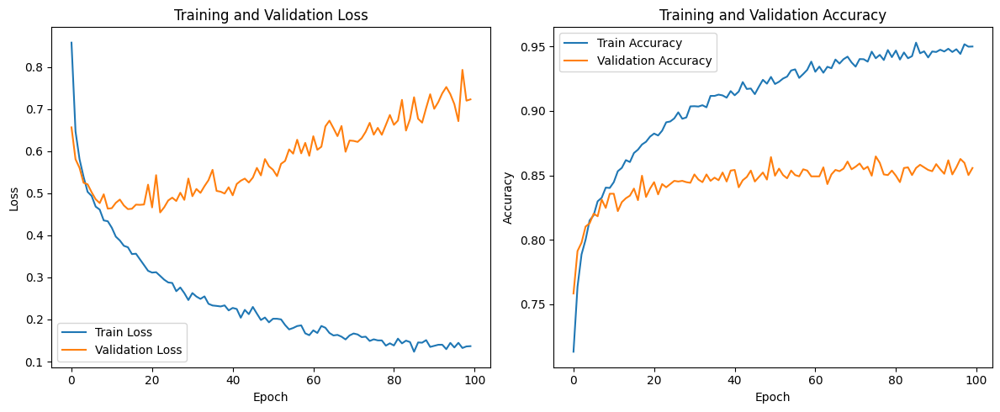


=== Evaluating MLP Classifier ===


Evaluating: 100%|██████████| 32/32 [00:00<00:00, 138.84it/s]


Accuracy: 0.8647
F1 Score (weighted): 0.8626
Precision (weighted): 0.8640
Recall (weighted): 0.8647

Per-class metrics:
Class bkl: Precision: 0.7198, Recall: 0.7591, F1: 0.7389
Class nv: Precision: 0.9315, Recall: 0.9426, F1: 0.9370
Class df: Precision: 1.0000, Recall: 0.5217, F1: 0.6857
Class mel: Precision: 0.7178, Recall: 0.6502, F1: 0.6824
Class vasc: Precision: 0.9231, Recall: 0.8571, F1: 0.8889
Class bcc: Precision: 0.7177, Recall: 0.8641, F1: 0.7841
Class akiec: Precision: 0.6200, Recall: 0.4769, F1: 0.5391


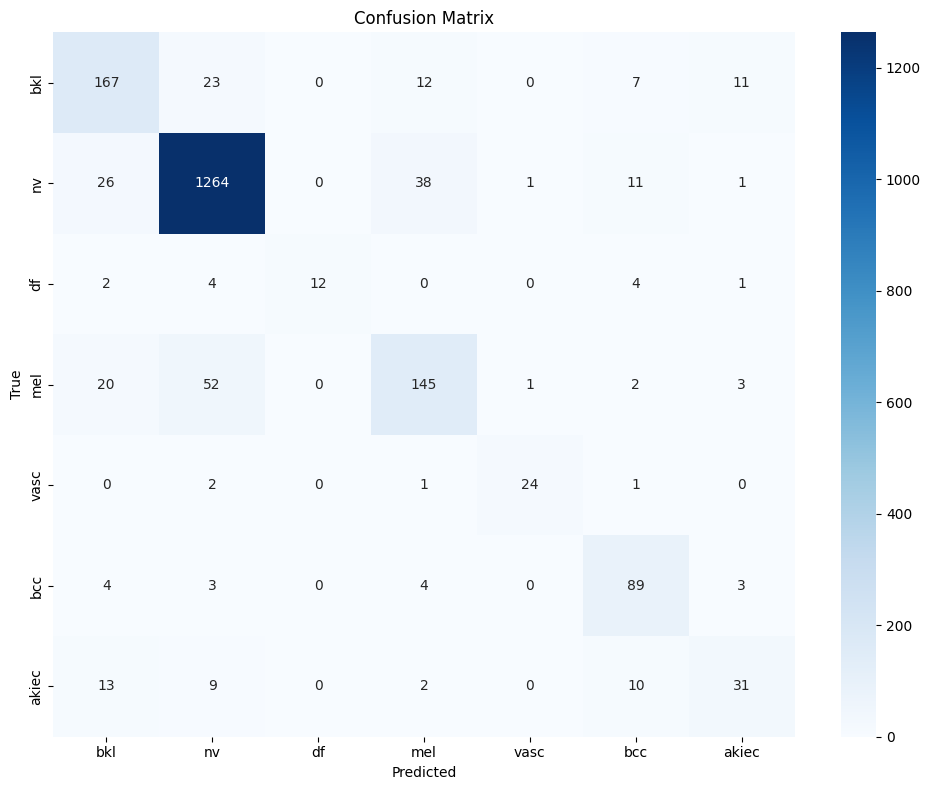

Training and evaluation complete!


In [ ]:
# Train and evaluate models
mlp_model, mlp_metrics = train_and_evaluate()

# Create labels dictionary
labels_dict = {}
for _, row in metadata.iterrows():
  labels_dict[row['image_id']] = row['class_idx']

    # Visualize features using t-SNE
  # visualize_features_tsne(features_dict, labels_dict)

print("Training and evaluation complete!")

#Attention Visualization

Downloading: "https://github.com/facebookresearch/dino/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/dino/dino_deitsmall16_pretrain/dino_deitsmall16_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dino_deitsmall16_pretrain.pth
100%|██████████| 82.7M/82.7M [00:00<00:00, 219MB/s]


DINO feature dimension: 384


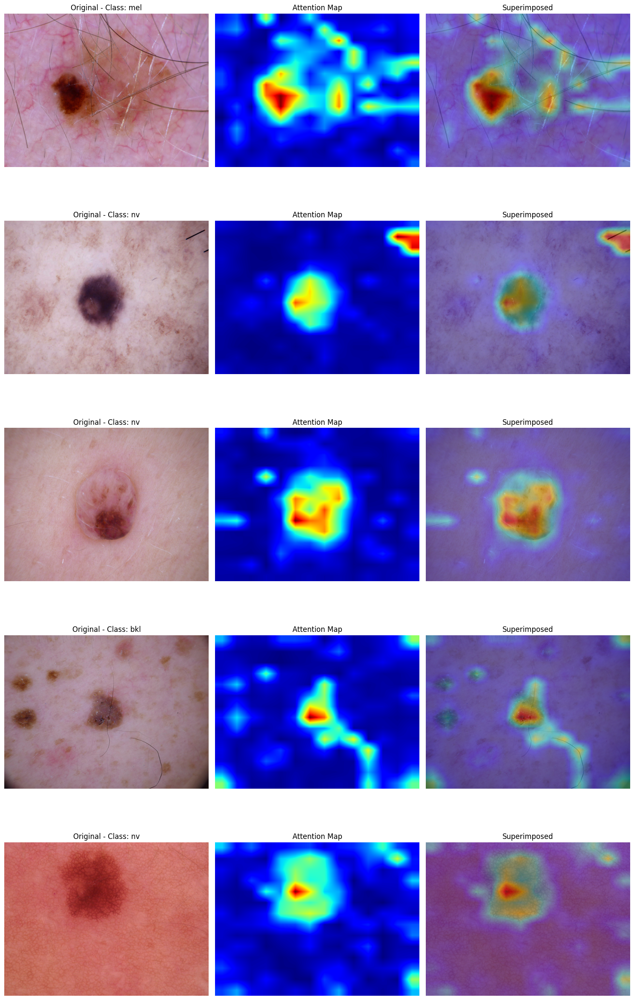

In [ ]:
    # Visualize attention maps
visualize_attention(num_samples=5)

#Assignmet no 4

##Installing Libs

In [ ]:
# Install necessary packages
!pip install -q transformers sentence-transformers matplotlib scikit-learn pandas seaborn torch torchvision pillow numpy tqdm


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 88.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 89.4 MB/s eta 0:00:00


The code sets up the environment for training a deep learning model using PyTorch. It imports necessary libraries, sets random seeds for reproducibility, and checks if a GPU (CUDA) is available for faster computation. The device is then selected accordingly (`cuda` for GPU or `cpu` if no GPU is available). This ensures consistent results and efficient model training.

In [ ]:

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sentence_transformers import SentenceTransformer
from transformers import BertTokenizer, BertModel
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from tqdm.notebook import tqdm
import random
import glob
from typing import List, Dict, Tuple, Optional

# Set random seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

set_seed()

# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cuda


This code is used to load and prepare the HAM10000 dataset along with DINO features:

1. **`load_data`**: Loads pre-extracted DINO features from a `.npz` file and stores them in a dictionary, mapping image IDs to features.
2. **`combine_images`**: Combines images from two directories, creating a dictionary that maps image IDs to their respective paths.
3. **`HAM10000_CLASSES`**: A dictionary mapping class names to their descriptions for the HAM10000 dataset.
4. **`load_metadata`**: Tries to load metadata from a CSV file. If not found, it returns `None`.
5. **`infer_classes`**: Assigns random classes to images if metadata is unavailable, serving as a placeholder.

These functions prepare the data for model training by organizing images and features.


In [ ]:
"""
## 1. Load and Prepare Dataset
"""

# Load the metadata and DINO features
def load_data(dino_features_path="/content/drive/MyDrive/HAM10000_dino_dataset/dino_features/dino_features.npz"):
    """Load DINO features and metadata"""

    # Load DINO features
    print(f"Loading DINO features from {dino_features_path}")
    dino_data = np.load(dino_features_path)
    dino_features = dino_data['features']
    dino_image_ids = dino_data['image_ids']

    # Convert image IDs to strings and remove file extensions if any
    dino_image_ids = [str(img_id).split('.')[0] for img_id in dino_image_ids]

    print(f"Loaded {len(dino_image_ids)} DINO features")

    # Create a mapping from image_id to features
    features_dict = {img_id: feat for img_id, feat in zip(dino_image_ids, dino_features)}

    return features_dict

# Combine images from both folders
def combine_images(base_path="/content/drive/MyDrive/HAM10000_dino_dataset"):
    """Combine images from both folders and create metadata"""
    folder1 = os.path.join(base_path, "ham10000_images_part_1")
    folder2 = os.path.join(base_path, "ham10000_images_part_2")

    # Get all image paths
    image_paths1 = glob.glob(os.path.join(folder1, "*.jpg"))
    image_paths2 = glob.glob(os.path.join(folder2, "*.jpg"))
    all_image_paths = image_paths1 + image_paths2

    print(f"Found {len(image_paths1)} images in folder 1")
    print(f"Found {len(image_paths2)} images in folder 2")
    print(f"Total images: {len(all_image_paths)}")

    # Extract image IDs
    image_ids = [os.path.basename(path).split('.')[0] for path in all_image_paths]
    image_paths = {img_id: path for img_id, path in zip(image_ids, all_image_paths)}

    return image_paths

# Define HAM10000 classes and mapping
HAM10000_CLASSES = {
    'akiec': 'Actinic Keratosis & Intraepithelial Carcinoma',
    'bcc': 'Basal Cell Carcinoma',
    'bkl': 'Benign Keratosis-like Lesions',
    'df': 'Dermatofibroma',
    'mel': 'Melanoma',
    'nv': 'Melanocytic Nevi',
    'vasc': 'Vascular Lesions'
}

# Try to load HAM10000 metadata if available (from published HAM10000 dataset)
def load_metadata(base_path="/content/drive/MyDrive/HAM10000_dino_dataset"):
    """Try to load HAM10000 metadata if available"""
    metadata_path = os.path.join(base_path, "HAM10000_metadata.csv")
    if os.path.exists(metadata_path):
        df = pd.read_csv(metadata_path)
        print(f"Loaded metadata with {len(df)} entries")
        return df
    else:
        print("Metadata file not found, inferring classes from folder structure")
        return None

# Infer classes from file structure if metadata not available
def infer_classes(image_paths):
    """Infer classes from folder structure if metadata not available"""
    # This is a placeholder - in practice, we'd need more information
    # to infer the classes correctly
    # For demonstration purposes, we'll assign random classes
    classes = list(HAM10000_CLASSES.keys())
    image_ids = list(image_paths.keys())
    assigned_classes = {img_id: random.choice(classes) for img_id in image_ids}
    return assigned_classes


In [ ]:
"""
## 2. Create Natural Language Prompts for Classes
"""

# Define class prompts (various natural language descriptions for each class)
def create_class_prompts():
    """Create natural language prompts for each class"""
    prompts = {
        'akiec': [
            "a dermoscopic image of actinic keratosis",
            "a photo showing intraepithelial carcinoma",
            "a skin lesion image of actinic keratosis",
            "a clinical picture of intraepithelial carcinoma of the skin"
        ],
        'bcc': [
            "a dermoscopic image of basal cell carcinoma",
            "a photo showing basal cell carcinoma of the skin",
            "a skin lesion image of basal cell carcinoma",
            "a clinical picture of BCC skin cancer"
        ],
        'bkl': [
            "a dermoscopic image of benign keratosis",
            "a photo showing seborrheic keratosis",
            "a skin lesion image of a benign keratosis-like lesion",
            "a clinical picture of benign keratosis"
        ],
        'df': [
            "a dermoscopic image of dermatofibroma",
            "a photo showing dermatofibroma of the skin",
            "a skin lesion image of dermatofibroma",
            "a clinical picture of a dermatofibroma"
        ],
        'mel': [
            "a dermoscopic image of melanoma",
            "a photo showing malignant melanoma",
            "a skin lesion image of melanoma",
            "a clinical picture of melanoma skin cancer"
        ],
        'nv': [
            "a dermoscopic image of melanocytic nevus",
            "a photo showing a common mole",
            "a skin lesion image of a melanocytic nevus",
            "a clinical picture of a melanocytic nevus"
        ],
        'vasc': [
            "a dermoscopic image of vascular lesion",
            "a photo showing angioma of the skin",
            "a skin lesion image of a vascular lesion",
            "a clinical picture of a vascular skin lesion"
        ]
    }
    return prompts


### Summary of Code:

1. **`TextEncoder`**:

   * A class that uses the `SentenceTransformer` to convert text into embeddings.
   * The constructor initializes the model (default: "all-MiniLM-L6-v2").
   * The `forward` method encodes the provided texts into embeddings using the model and returns them.

2. **`ImageFeatureAdapter`**:

   * A class that takes pre-extracted image features (from DINO) and adapts them to a specific dimension using a simple neural network.
   * It uses two fully connected layers with ReLU activation to adapt the input features to the desired output dimension.

These classes allow for encoding both text and image data in a way that can be used for tasks like multi-modal learning (combining text and image features).


In [ ]:
"""
## 3. Image and Text Encoders
"""

# Create text encoder using SentenceTransformer
class TextEncoder(nn.Module):
    def __init__(self, model_name="all-MiniLM-L6-v2"):
        super(TextEncoder, self).__init__()
        self.model = SentenceTransformer(model_name)
        self.output_dim = self.model.get_sentence_embedding_dimension()

    def forward(self, texts):
        # Encode the text prompts
        with torch.no_grad():
            embeddings = self.model.encode(texts, convert_to_tensor=True)
        return embeddings

# Image encoder adapter (already have DINO features)
class ImageFeatureAdapter(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(ImageFeatureAdapter, self).__init__()
        self.adapter = nn.Sequential(
            nn.Linear(input_dim, output_dim),
            nn.ReLU(),
            nn.Linear(output_dim, output_dim)
        )

    def forward(self, x):
        return self.adapter(x)


In [ ]:
"""
## 4. Dataset and Dataloader
"""

class HAM10000PromptDataset(Dataset):
    def __init__(self,
                 image_ids: List[str],
                 labels: Dict[str, str],
                 features_dict: Dict[str, np.ndarray],
                 class_prompts: Dict[str, List[str]],
                 transform=None):
        """
        Dataset for HAM10000 with DINO features and text prompts
        """
        self.image_ids = image_ids
        self.labels = labels
        self.features_dict = features_dict
        self.class_prompts = class_prompts
        self.transform = transform

        # Filter image_ids to only those with features
        self.filtered_image_ids = [img_id for img_id in self.image_ids if img_id in self.features_dict]

        # Print stats
        print(f"Dataset contains {len(self.filtered_image_ids)} images with features")
        if len(self.filtered_image_ids) < len(self.image_ids):
            print(f"Filtered out {len(self.image_ids) - len(self.filtered_image_ids)} images without features")

    def __len__(self):
        return len(self.filtered_image_ids)

    def __getitem__(self, idx):
        img_id = self.filtered_image_ids[idx]
        label = self.labels[img_id]

        # Get DINO features
        features = self.features_dict[img_id]
        features = torch.tensor(features, dtype=torch.float32)

        # Get a random prompt for the class
        prompts = self.class_prompts[label]
        positive_prompt = random.choice(prompts)

        # Get a negative prompt (from a different class)
        negative_classes = [c for c in self.class_prompts.keys() if c != label]
        negative_class = random.choice(negative_classes)
        negative_prompt = random.choice(self.class_prompts[negative_class])

        return {
            'image_id': img_id,
            'features': features,
            'label': label,
            'positive_prompt': positive_prompt,
            'negative_prompt': negative_prompt,
            'all_prompts': [random.choice(self.class_prompts[c]) for c in self.class_prompts.keys()]
        }


In [ ]:
"""
## 5. Model and Loss Functions
"""

class PromptBasedModel(nn.Module):
    def __init__(self, image_feature_dim, text_encoder_dim, projection_dim=256):
        super(PromptBasedModel, self).__init__()
        self.image_adapter = ImageFeatureAdapter(image_feature_dim, projection_dim)
        self.text_adapter = nn.Linear(text_encoder_dim, projection_dim)
        self.text_encoder = TextEncoder()

    def encode_image(self, image_features):
        return F.normalize(self.image_adapter(image_features), p=2, dim=1)

    def encode_text(self, text_prompts):
        text_features = self.text_encoder(text_prompts)
        return F.normalize(self.text_adapter(text_features), p=2, dim=1)

    def forward(self, image_features, text_prompts):
        image_embeddings = self.encode_image(image_features)
        text_embeddings = self.encode_text(text_prompts)
        return image_embeddings, text_embeddings

def contrastive_loss(image_embeddings, text_embeddings, temperature=0.07):
    """
    Compute the contrastive loss between image and text embeddings
    """
    # Compute similarity scores
    logits = torch.matmul(image_embeddings, text_embeddings.T) / temperature

    # Labels are the diagonal elements (matching pairs)
    labels = torch.arange(len(image_embeddings), device=image_embeddings.device)

    # Compute loss (cross-entropy)
    loss_i2t = F.cross_entropy(logits, labels)
    loss_t2i = F.cross_entropy(logits.T, labels)

    return (loss_i2t + loss_t2i) / 2

def triplet_loss(anchor, positive, negative, margin=1.0):
    """
    Compute triplet loss
    """
    distance_pos = F.pairwise_distance(anchor, positive)
    distance_neg = F.pairwise_distance(anchor, negative)
    losses = F.relu(distance_pos - distance_neg + margin)
    return losses.mean()


In [ ]:
"""
## 6. Training Loop
"""

def train_epoch(model, data_loader, optimizer, device, use_triplet=False):
    model.train()
    total_loss = 0.0

    with tqdm(data_loader, desc="Training") as pbar:
        for batch in pbar:
            # Get image features and positive/negative prompts
            image_features = batch['features'].to(device)
            positive_prompts = batch['positive_prompt']
            negative_prompts = batch['negative_prompt']

            # Forward pass
            if use_triplet:
                # Triplet loss approach
                anchor_emb = model.encode_image(image_features)
                positive_emb = model.encode_text(positive_prompts)
                negative_emb = model.encode_text(negative_prompts)

                loss = triplet_loss(anchor_emb, positive_emb, negative_emb)
            else:
                # Contrastive loss approach
                all_prompts = positive_prompts
                image_emb, text_emb = model(image_features, all_prompts)

                loss = contrastive_loss(image_emb, text_emb)

            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            pbar.set_postfix({"Loss": loss.item()})

    return total_loss / len(data_loader)

def validate(model, data_loader, device):
    model.eval()
    all_image_embeddings = []
    all_text_embeddings = []
    all_labels = []
    all_image_ids = []
    all_prompts = []

    with torch.no_grad():
        for batch in tqdm(data_loader, desc="Validation"):
            image_features = batch['features'].to(device)
            all_class_prompts = batch['all_prompts']

            # Flatten prompts for batch processing
            flat_prompts = [p for prompt_list in all_class_prompts for p in prompt_list]
            class_ids = list(HAM10000_CLASSES.keys()) * len(batch['image_id'])

            # Encode images and prompts
            image_emb = model.encode_image(image_features)
            text_emb = model.encode_text(flat_prompts)

            # Reshape text embeddings to match batch size
            text_emb = text_emb.reshape(len(batch['image_id']), len(HAM10000_CLASSES), -1)

            all_image_embeddings.append(image_emb)
            all_text_embeddings.append(text_emb)
            all_labels.extend(batch['label'])
            all_image_ids.extend(batch['image_id'])
            all_prompts.append(flat_prompts)

    # Concatenate all embeddings
    all_image_embeddings = torch.cat(all_image_embeddings, dim=0)

    # Calculate metrics
    results = calculate_metrics(model, all_image_embeddings, all_text_embeddings, all_labels, all_image_ids, device)

    return results

def calculate_metrics(model, image_embeddings, text_embeddings_batched, labels, image_ids, device):
    """Calculate accuracy and other metrics"""
    class_list = list(HAM10000_CLASSES.keys())
    correct = 0
    top3_correct = 0
    total = 0

    # Create a confusion matrix
    confusion = torch.zeros(len(class_list), len(class_list), device=device)

    # For each image, compute similarity with all class prompts
    for i, (img_emb, text_emb_batch) in enumerate(zip(image_embeddings, text_embeddings_batched)):
        # Compute similarity scores
        img_emb = img_emb.unsqueeze(0)  # Add batch dimension

        # Compute similarity for each class
        similarities = []

        # The issue is here - text_emb_batch shape is [num_classes, embedding_dim]
        # where num_classes should match len(class_list)
        for class_idx in range(len(class_list)):
            if class_idx >= text_emb_batch.shape[0]:
                print(f"Warning: class_idx {class_idx} is out of bounds for text_emb_batch with shape {text_emb_batch.shape}")
                continue

            class_emb = text_emb_batch[class_idx]  # Get embeddings for this class

            # Ensure both embeddings are the right shape
            if img_emb.dim() > 1:
                img_emb = img_emb.squeeze()

            # Take mean of class embeddings if there are multiple per class
            if class_emb.dim() > 1:
                class_emb = class_emb.mean(dim=0)  # Average all prompts for this class

            # Calculate similarity
            sim = F.cosine_similarity(img_emb, class_emb, dim=0).item()
            similarities.append(sim)

        # Skip if we couldn't calculate similarities for some reason
        if not similarities:
            print(f"Warning: No similarities calculated for image {i}")
            continue

        # Get predicted class (highest similarity)
        pred_idx = np.argmax(similarities)

        # Ensure pred_idx is within bounds
        if pred_idx >= len(class_list):
            print(f"Warning: pred_idx {pred_idx} is out of bounds for class_list with length {len(class_list)}")
            continue

        pred_class = class_list[pred_idx]

        # Get ground truth class
        true_class = labels[i]

        # Ensure true_class is in class_list
        if true_class not in class_list:
            print(f"Warning: true_class {true_class} not in class_list")
            continue

        true_idx = class_list.index(true_class)

        # Update confusion matrix
        confusion[true_idx, pred_idx] += 1

        # Update accuracy
        total += 1
        if pred_class == true_class:
            correct += 1

        # Top-3 accuracy
        # Make sure we don't try to get more indices than we have similarities
        top_k = min(3, len(similarities))
        top3_indices = np.argsort(similarities)[-top_k:]
        if true_idx in top3_indices:
            top3_correct += 1

    # Calculate metrics
    accuracy = correct / total if total > 0 else 0
    top3_accuracy = top3_correct / total if total > 0 else 0

    results = {
        "accuracy": accuracy,
        "top3_accuracy": top3_accuracy,
        "confusion_matrix": confusion.cpu().numpy(),
        "class_list": class_list
    }

    return results


In [ ]:
"""
## 7. Visualization Functions
"""

def plot_confusion_matrix(cm, class_names):
    """Plot confusion matrix"""
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='.1f', xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

def plot_similarity_heatmap(model, dataset, device, num_samples=10):
    """Plot similarity heatmap between images and prompts"""
    model.eval()

    # Get random samples
    indices = random.sample(range(len(dataset)), min(num_samples, len(dataset)))
    samples = [dataset[i] for i in indices]

    # Extract features and prompts
    image_features = torch.stack([s['features'] for s in samples]).to(device)
    all_prompts = []
    for class_name in HAM10000_CLASSES:
        # Take first prompt for each class
        all_prompts.append(dataset.class_prompts[class_name][0])

    # Get embeddings
    with torch.no_grad():
        image_emb = model.encode_image(image_features)
        text_emb = model.encode_text(all_prompts)

    # Compute similarity matrix
    similarity = torch.matmul(image_emb, text_emb.T).cpu().numpy()

    # Plot heatmap
    plt.figure(figsize=(12, 8))
    sample_labels = [f"{s['image_id']} ({s['label']})" for s in samples]
    sns.heatmap(similarity, annot=True, fmt='.2f',
                xticklabels=list(HAM10000_CLASSES.keys()),
                yticklabels=sample_labels)
    plt.xlabel('Prompts')
    plt.ylabel('Images')
    plt.title('Image-Prompt Similarity Matrix')
    plt.tight_layout()
    plt.show()

def plot_top_k_matches(model, dataset, device, k=3, num_samples=5):
    """Plot top-k matching results for random samples"""
    model.eval()

    # Get random samples
    indices = random.sample(range(len(dataset)), min(num_samples, len(dataset)))
    samples = [dataset[i] for i in indices]

    # Extract features
    image_features = torch.stack([s['features'] for s in samples]).to(device)

    # Get all prompts
    all_prompts = []
    prompt_classes = []
    for class_name, prompts in dataset.class_prompts.items():
        for prompt in prompts:
            all_prompts.append(prompt)
            prompt_classes.append(class_name)

    # Get embeddings
    with torch.no_grad():
        image_emb = model.encode_image(image_features)
        text_emb = model.encode_text(all_prompts)

    # Compute similarity
    similarity = torch.matmul(image_emb, text_emb.T).cpu().numpy()

    # For each image, get top-k prompts
    plt.figure(figsize=(15, num_samples * 3))

    for i, (sample, sim_scores) in enumerate(zip(samples, similarity)):
        top_k_indices = np.argsort(sim_scores)[-k:][::-1]
        top_k_prompts = [all_prompts[idx] for idx in top_k_indices]
        top_k_scores = [sim_scores[idx] for idx in top_k_indices]
        top_k_classes = [prompt_classes[idx] for idx in top_k_indices]

        plt.subplot(num_samples, 1, i+1)
        plt.barh(range(k), top_k_scores)
        plt.yticks(range(k), top_k_prompts)
        plt.xlabel('Similarity Score')
        plt.title(f"Image {sample['image_id']} (True class: {sample['label']})")

        # Highlight correct class matches
        for j, cls in enumerate(top_k_classes):
            if cls == sample['label']:
                plt.gca().get_yticklabels()[j].set_color('green')
            else:
                plt.gca().get_yticklabels()[j].set_color('red')

    plt.tight_layout()
    plt.show()


In [ ]:
"""
## 8. Main Execution
"""

def main():
    # Load DINO features
    features_dict = load_data()

    # Get image paths
    image_paths = combine_images()

    # Try to load metadata or infer classes
    metadata_df = load_metadata()

    if metadata_df is not None:
        # Create a mapping from image_id to diagnosis (class)
        labels = dict(zip(metadata_df['image_id'], metadata_df['dx']))
    else:
        # Infer classes if metadata not available
        labels = infer_classes(image_paths)

    # Create class prompts
    class_prompts = create_class_prompts()

    # Create dataset
    image_ids = list(image_paths.keys())

    # Split data
    train_ids, test_ids = train_test_split(image_ids, test_size=0.2, random_state=42)

    # Create datasets
    train_dataset = HAM10000PromptDataset(
        image_ids=train_ids,
        labels=labels,
        features_dict=features_dict,
        class_prompts=class_prompts
    )

    test_dataset = HAM10000PromptDataset(
        image_ids=test_ids,
        labels=labels,
        features_dict=features_dict,
        class_prompts=class_prompts
    )

    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    # Initialize model
    dino_feature_dim = next(iter(features_dict.values())).shape[0]
    text_encoder = TextEncoder()
    text_encoder_dim = text_encoder.output_dim

    model = PromptBasedModel(
        image_feature_dim=dino_feature_dim,
        text_encoder_dim=text_encoder_dim
    ).to(device)

    # Initialize optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    # Training loop
    num_epochs = 100
    best_accuracy = 0.0

    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs}")

        # Train
        train_loss = train_epoch(model, train_loader, optimizer, device)
        print(f"Training Loss: {train_loss:.4f}")

        # Validate
        val_results = validate(model, test_loader, device)
        print(f"Validation Accuracy: {val_results['accuracy']:.4f}")
        print(f"Top-3 Accuracy: {val_results['top3_accuracy']:.4f}")

        # Save best model
        if val_results['accuracy'] > best_accuracy:
            best_accuracy = val_results['accuracy']
            torch.save(model.state_dict(), 'best_prompt_model.pth')

    # Load best model for evaluation
    model.load_state_dict(torch.load('best_prompt_model.pth'))

    # Final evaluation
    final_results = validate(model, test_loader, device)
    print("\nFinal Results:")
    print(f"Accuracy: {final_results['accuracy']:.4f}")
    print(f"Top-3 Accuracy: {final_results['top3_accuracy']:.4f}")

    # Plot confusion matrix
    plot_confusion_matrix(
        final_results['confusion_matrix'],
        final_results['class_list']
    )

    # Plot similarity heatmap
    plot_similarity_heatmap(model, test_dataset, device)

    # Plot top-k matches
    plot_top_k_matches(model, test_dataset, device)


Loading DINO features from /content/drive/MyDrive/HAM10000_dino_dataset/dino_features/dino_features.npz
Loaded 10015 DINO features
Found 5000 images in folder 1
Found 5015 images in folder 2
Total images: 10015
Loaded metadata with 10015 entries
Dataset contains 8012 images with features
Dataset contains 2003 images with features

Epoch 1/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 3.1399


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1429
Top-3 Accuracy: 0.3968

Epoch 2/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.9678


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2063
Top-3 Accuracy: 0.4444

Epoch 3/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.9027


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2381
Top-3 Accuracy: 0.4127

Epoch 4/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.8566


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1746
Top-3 Accuracy: 0.3810

Epoch 5/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.8213


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1746
Top-3 Accuracy: 0.5238

Epoch 6/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.7856


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2063
Top-3 Accuracy: 0.3492

Epoch 7/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.7493


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2063
Top-3 Accuracy: 0.4444

Epoch 8/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.7283


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2222
Top-3 Accuracy: 0.5238

Epoch 9/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.6947


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1587
Top-3 Accuracy: 0.4603

Epoch 10/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.6730


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2540
Top-3 Accuracy: 0.5079

Epoch 11/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.6547


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1905
Top-3 Accuracy: 0.4921

Epoch 12/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.6356


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2222
Top-3 Accuracy: 0.4127

Epoch 13/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.6123


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2063
Top-3 Accuracy: 0.5238

Epoch 14/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5985


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1905
Top-3 Accuracy: 0.5079

Epoch 15/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5797


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1905
Top-3 Accuracy: 0.5556

Epoch 16/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5652


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1905
Top-3 Accuracy: 0.5397

Epoch 17/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5515


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2381
Top-3 Accuracy: 0.5556

Epoch 18/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5406


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1746
Top-3 Accuracy: 0.5873

Epoch 19/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5266


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2063
Top-3 Accuracy: 0.6349

Epoch 20/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5205


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.6190

Epoch 21/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5145


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3175
Top-3 Accuracy: 0.6667

Epoch 22/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5096


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.6349

Epoch 23/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.5035


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.6825

Epoch 24/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4941


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.1905
Top-3 Accuracy: 0.5397

Epoch 25/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4873


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3810
Top-3 Accuracy: 0.7302

Epoch 26/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4874


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7460

Epoch 27/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4921


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.6508

Epoch 28/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4783


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2540
Top-3 Accuracy: 0.6190

Epoch 29/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4767


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.6667

Epoch 30/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4751


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2857
Top-3 Accuracy: 0.7143

Epoch 31/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4783


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4286
Top-3 Accuracy: 0.6825

Epoch 32/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4744


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3175
Top-3 Accuracy: 0.7619

Epoch 33/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4710


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3175
Top-3 Accuracy: 0.6825

Epoch 34/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4732


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3651
Top-3 Accuracy: 0.7619

Epoch 35/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4652


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3651
Top-3 Accuracy: 0.7143

Epoch 36/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4717


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3968
Top-3 Accuracy: 0.7778

Epoch 37/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4724


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2381
Top-3 Accuracy: 0.6984

Epoch 38/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4644


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3175
Top-3 Accuracy: 0.7460

Epoch 39/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4635


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4286
Top-3 Accuracy: 0.7778

Epoch 40/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4601


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2698
Top-3 Accuracy: 0.7302

Epoch 41/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4568


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4286
Top-3 Accuracy: 0.7778

Epoch 42/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4595


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2381
Top-3 Accuracy: 0.6349

Epoch 43/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4558


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.7460

Epoch 44/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4555


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.6984

Epoch 45/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4574


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3175
Top-3 Accuracy: 0.7937

Epoch 46/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4588


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3651
Top-3 Accuracy: 0.7460

Epoch 47/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4648


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4444
Top-3 Accuracy: 0.7937

Epoch 48/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4545


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7460

Epoch 49/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4592


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3016
Top-3 Accuracy: 0.7302

Epoch 50/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4594


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2540
Top-3 Accuracy: 0.6825

Epoch 51/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4597


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7778

Epoch 52/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4538


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2698
Top-3 Accuracy: 0.7460

Epoch 53/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4473


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2540
Top-3 Accuracy: 0.7619

Epoch 54/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4539


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.7619

Epoch 55/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4549


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2540
Top-3 Accuracy: 0.7302

Epoch 56/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4521


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3651
Top-3 Accuracy: 0.7619

Epoch 57/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4513


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.8254

Epoch 58/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4491


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7460

Epoch 59/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4518


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3810
Top-3 Accuracy: 0.7302

Epoch 60/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4518


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3810
Top-3 Accuracy: 0.7937

Epoch 61/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4512


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7778

Epoch 62/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4510


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3016
Top-3 Accuracy: 0.7778

Epoch 63/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4460


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3016
Top-3 Accuracy: 0.7302

Epoch 64/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4472


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2857
Top-3 Accuracy: 0.7460

Epoch 65/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4592


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2698
Top-3 Accuracy: 0.7778

Epoch 66/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4518


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.7937

Epoch 67/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4534


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3016
Top-3 Accuracy: 0.7619

Epoch 68/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4503


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.7778

Epoch 69/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4542


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3968
Top-3 Accuracy: 0.8095

Epoch 70/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4559


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4127
Top-3 Accuracy: 0.7460

Epoch 71/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4513


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3810
Top-3 Accuracy: 0.8095

Epoch 72/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4472


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3016
Top-3 Accuracy: 0.7619

Epoch 73/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4476


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3968
Top-3 Accuracy: 0.7937

Epoch 74/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4518


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3175
Top-3 Accuracy: 0.7619

Epoch 75/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4465


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3651
Top-3 Accuracy: 0.7778

Epoch 76/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4433


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3968
Top-3 Accuracy: 0.7778

Epoch 77/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4483


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2381
Top-3 Accuracy: 0.7302

Epoch 78/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4506


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3175
Top-3 Accuracy: 0.7619

Epoch 79/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4499


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2698
Top-3 Accuracy: 0.7778

Epoch 80/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4542


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3810
Top-3 Accuracy: 0.7778

Epoch 81/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4504


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3175
Top-3 Accuracy: 0.7778

Epoch 82/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4493


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7937

Epoch 83/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4475


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7302

Epoch 84/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4457


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4444
Top-3 Accuracy: 0.8095

Epoch 85/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4471


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3968
Top-3 Accuracy: 0.7937

Epoch 86/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4438


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4444
Top-3 Accuracy: 0.7778

Epoch 87/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4449


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7302

Epoch 88/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4446


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.7302

Epoch 89/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4439


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3968
Top-3 Accuracy: 0.8095

Epoch 90/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4480


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.7778

Epoch 91/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4471


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3810
Top-3 Accuracy: 0.7937

Epoch 92/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4425


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4286
Top-3 Accuracy: 0.7937

Epoch 93/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4463


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3333
Top-3 Accuracy: 0.7937

Epoch 94/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4496


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4444
Top-3 Accuracy: 0.8413

Epoch 95/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4460


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3016
Top-3 Accuracy: 0.7619

Epoch 96/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4432


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.2857
Top-3 Accuracy: 0.7302

Epoch 97/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4416


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3651
Top-3 Accuracy: 0.8095

Epoch 98/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4480


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3968
Top-3 Accuracy: 0.8095

Epoch 99/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4433


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.4286
Top-3 Accuracy: 0.7778

Epoch 100/100


Training:   0%|          | 0/251 [00:00<?, ?it/s]

Training Loss: 2.4414


Validation:   0%|          | 0/63 [00:00<?, ?it/s]

Validation Accuracy: 0.3492
Top-3 Accuracy: 0.7778


Validation:   0%|          | 0/63 [00:00<?, ?it/s]


Final Results:
Accuracy: 0.3810
Top-3 Accuracy: 0.8095


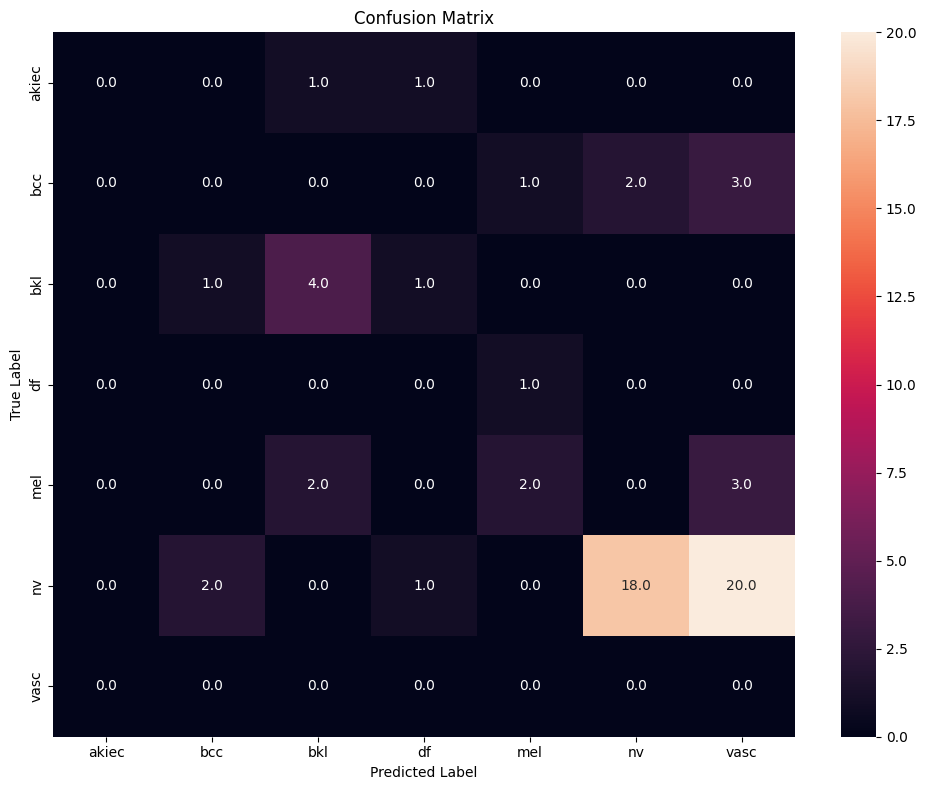

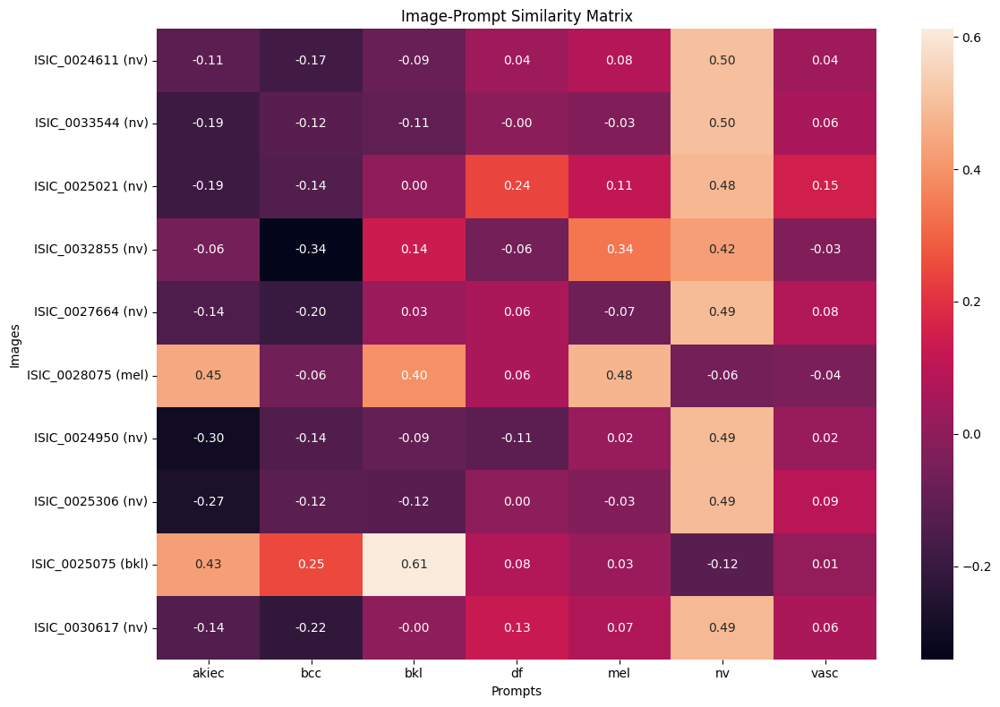

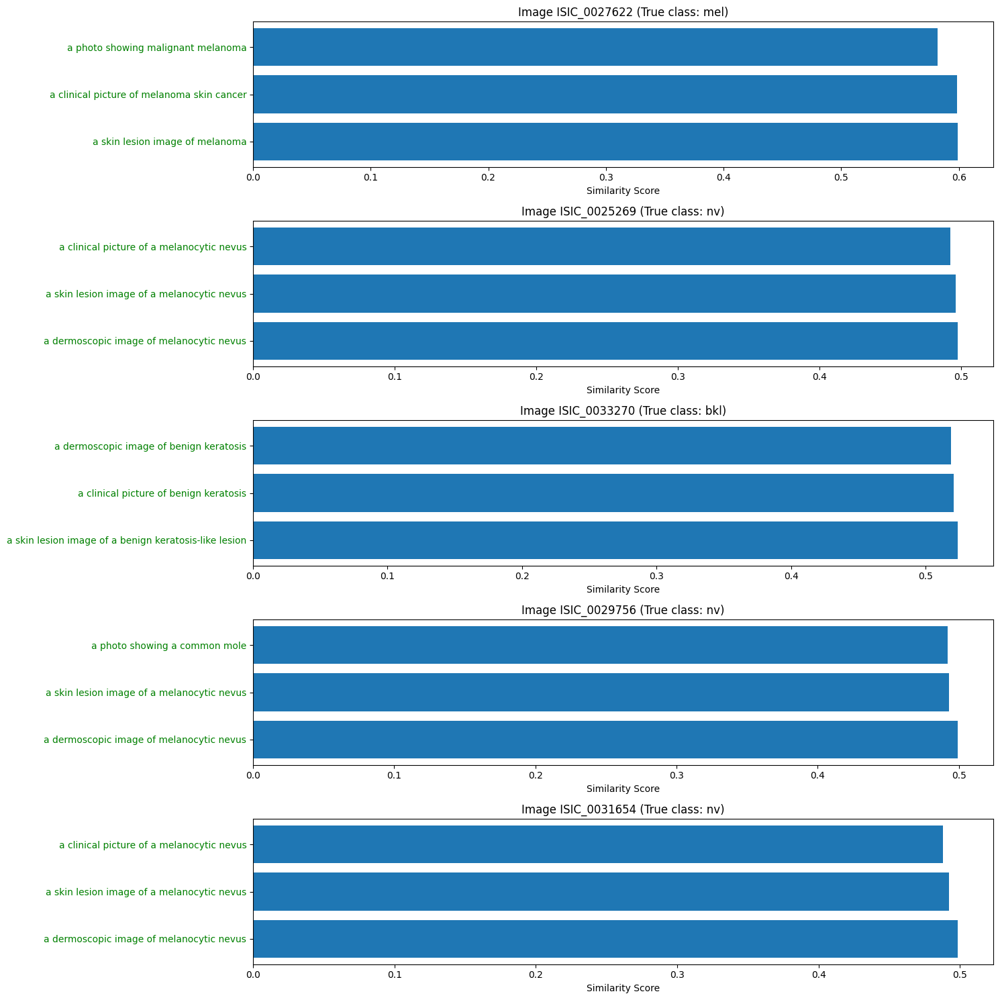

In [ ]:
main()